##Load Data

In [ ]:
!nvidia-smi

Wed Aug 21 06:16:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Copy datasets
!cp /content/drive/MyDrive/Datasets/Augmented_Dataset-20240819T143109Z-001.zip .

In [ ]:
!unzip '/content/Augmented_Dataset-20240819T143109Z-001' -d '/content/'

Streaming output truncated to the last 5000 lines.
  inflating: /content/Augmented_Dataset/AD/AD_1626_Zoom (10_).png  
  inflating: /content/Augmented_Dataset/AD/AD_1623_Zoom (10_).png  
  inflating: /content/Augmented_Dataset/AD/AD_1628_Zoom (10_).png  
  inflating: /content/Augmented_Dataset/AD/AD_1632_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_163_Rotation (135°).png  
  inflating: /content/Augmented_Dataset/AD/AD_1622_Rotation (135°).png  
  inflating: /content/Augmented_Dataset/AD/AD_1619_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_162_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_1632_Zoom (10_).png  
  inflating: /content/Augmented_Dataset/AD/AD_1623_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_1624_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_163_Rotation (45°).png  
  inflating: /content/Augmented_Dataset/AD/AD_1628_Rotation (135°).png  
  inflating: /content/Augment

In [ ]:
import os
os.rename('/content/3_cls','/content/Datasets')

In [ ]:
#Count data
import os

# Define the paths to the directories
ad_dir = "/content/Augmented_Dataset/AD"
control_dir = "/content/Augmented_Dataset/CONTROL"
pd_dir = "/content/Augmented_Dataset/PD"

# Use the os module to count the number of files in each directory
ad_count = len(os.listdir(ad_dir))
control_count = len(os.listdir(control_dir))
pd_count = len(os.listdir(pd_dir))

# Print the results
print(f"Number of files in {ad_dir}: {ad_count}")
print(f"Number of files in {control_dir}: {control_count}")
print(f"Number of files in {pd_dir}: {pd_count}")

Number of files in /content/Augmented_Dataset/AD: 10244
Number of files in /content/Augmented_Dataset/CONTROL: 9773
Number of files in /content/Augmented_Dataset/PD: 2718


In [ ]:
num_ad = round(ad_count*.15)
num_control = round(control_count*.15)
num_pd = round(pd_count*.15)

print(f"Validate for ad : {num_ad}")
print(f"Validate for control : {num_control}")
print(f"Validate for pd : {num_pd}")

Validate for ad : 1537
Validate for control : 1466
Validate for pd : 408


In [ ]:
import os
import random

# Define the paths to the source and test directories
source_dir = "/content/Augmented_Dataset"
test_dir = "/content/test"

val_ratio = 0.2

# Define the number of files to select for each test category
num_ad = round(ad_count*val_ratio)
num_control = round(control_count*val_ratio)
num_pd = round(pd_count*val_ratio)

# Define the paths to the source directories for each test category
ad_dir = os.path.join(source_dir, "AD")
control_dir = os.path.join(source_dir, "CONTROL")
pd_dir = os.path.join(source_dir, "PD")

# Define the paths to the test directories for each test category
ad_test_dir = os.path.join(test_dir, "AD")
control_test_dir = os.path.join(test_dir, "CONTROL")
pd_test_dir = os.path.join(test_dir, "PD")

# Create the test directories if they don't already exist
os.makedirs(ad_test_dir, exist_ok=True)
os.makedirs(control_test_dir, exist_ok=True)
os.makedirs(pd_test_dir, exist_ok=True)

# Set the random seed for reproducibility
random.seed(42)

# Randomly select files from each source directory and move them to the corresponding test directory
fiber_files = random.sample(os.listdir(ad_dir), num_ad)
for f in fiber_files:
    src_file = os.path.join(ad_dir, f)
    dst_file = os.path.join(ad_test_dir, f)
    os.rename(src_file, dst_file)

film_files = random.sample(os.listdir(control_dir), num_control)
for f in film_files:
    src_file = os.path.join(control_dir, f)
    dst_file = os.path.join(control_test_dir, f)
    os.rename(src_file, dst_file)

fragment_files = random.sample(os.listdir(pd_dir), num_pd)
for f in fragment_files:
    src_file = os.path.join(pd_dir, f)
    dst_file = os.path.join(pd_test_dir, f)
    os.rename(src_file, dst_file)


In [ ]:
#Count data
import os

# Define the paths to the directories
ad_dir = "/content/Augmented_Dataset/AD"
control_dir = "/content/Augmented_Dataset/CONTROL"
pd_dir = "/content/Augmented_Dataset/PD"

# Use the os module to count the number of files in each directory
ad_count = len(os.listdir(ad_dir))
control_count = len(os.listdir(control_dir))
pd_count = len(os.listdir(pd_dir))

# Print the results
print(f"Number of files in {ad_dir}: {ad_count}")
print(f"Number of files in {control_dir}: {control_count}")
print(f"Number of files in {pd_dir}: {pd_count}")


Number of files in /content/Augmented_Dataset/AD: 8195
Number of files in /content/Augmented_Dataset/CONTROL: 7818
Number of files in /content/Augmented_Dataset/PD: 2174


In [ ]:
#Count data
import os

# Define the paths to the directories
ad_dir = "/content/test/AD"
control_dir = "/content/test/CONTROL"
pd_dir = "/content/test/PD"

# Use the os module to count the number of files in each directory
ad_count = len(os.listdir(ad_dir))
control_count = len(os.listdir(control_dir))
pd_count = len(os.listdir(pd_dir))

# Print the results
print(f"Number of files in {ad_dir}: {ad_count}")
print(f"Number of files in {control_dir}: {control_count}")
print(f"Number of files in {pd_dir}: {pd_count}")

Number of files in /content/test/AD: 2049
Number of files in /content/test/CONTROL: 1955
Number of files in /content/test/PD: 544


#Install Timm

In [ ]:
# Install Timm (Need to restart the runtime after finish install )
!pip install git+https://github.com/rwightman/pytorch-image-models.git
!pip install lightning transformers datasets evaluate pillow==9.2.0

  Cloning https://github.com/rwightman/pytorch-image-models.git to /tmp/pip-req-build-xpb59nsv
  Running command git clone --filter=blob:none --quiet https://github.com/rwightman/pytorch-image-models.git /tmp/pip-req-build-xpb59nsv
  Resolved https://github.com/rwightman/pytorch-image-models.git to commit ac3470188b914c5d7a5058a7e28b9eb685a62427
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-p

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import DataLoader, random_split, Dataset

# Pytorch Image model (TIMM) library: a library for state-of-the-art image classification
import timm
import timm.optim
import timm.scheduler
from timm.data import ImageDataset, create_dataset, create_loader
from timm.data.transforms_factory import create_transform

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from PIL import Image

import evaluate

import numpy as np
import pandas as pd
from scipy import stats

from tqdm.notebook import tqdm

import glob

from sklearn.model_selection import StratifiedKFold,KFold

from lightning.fabric import Fabric

from copy import copy

import shutil

from sklearn.utils.class_weight import compute_class_weight

##visualization Model

In [ ]:
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

[INFO] Couldn't find torchinfo... installing it.


In [ ]:
# Select model (List of available is shown above)
mobilenetv3_small = "hf_hub:timm/tf_mobilenetv3_small_100.in1k"
mobilenetv3_small_model= timm.create_model(mobilenetv3_small, pretrained=True, num_classes=4)
# Print a summary using torchinfo (uncomment for actual output)
summary(model=mobilenetv3_small_model,
        input_size=(16, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

config.json:   0%|          | 0.00/573 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/10.2M [00:00<?, ?B/s]

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
MobileNetV3 (MobileNetV3)                          [16, 3, 224, 224]    [16, 4]              --                   True
├─Conv2dSame (conv_stem)                           [16, 3, 224, 224]    [16, 16, 112, 112]   432                  True
├─BatchNormAct2d (bn1)                             [16, 16, 112, 112]   [16, 16, 112, 112]   32                   True
│    └─Identity (drop)                             [16, 16, 112, 112]   [16, 16, 112, 112]   --                   --
│    └─Hardswish (act)                             [16, 16, 112, 112]   [16, 16, 112, 112]   --                   --
├─Sequential (blocks)                              [16, 16, 112, 112]   [16, 576, 7, 7]      --                   True
│    └─Sequential (0)                              [16, 16, 112, 112]   [16, 16, 56, 56]     --                   True
│    │    └─DepthwiseSeparableConv (0)         

In [ ]:
# Transform image data based on ImageNet's mean and std
transforms = {
    "train": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
    "test": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ])
}

In [ ]:
train_dir = '/content/Augmented_Dataset'

In [ ]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets
dataset = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=transforms["train"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [ ]:
dataset.class_to_idx

{'AD': 0, 'CONTROL': 1, 'PD': 2}

In [ ]:
len(dataset)

18187

In [ ]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
#Select Model
model_name = "hf_hub:timm/tf_mobilenetv3_small_100.in1k"

In [ ]:
num_epochs = 5
criterion = nn.CrossEntropyLoss()

# Cross Validation Configuration
k_splits = 5
metric = evaluate.load("accuracy")

In [ ]:
# Cross validation
kf = KFold(n_splits=k_splits, shuffle=True, random_state=42)

In [ ]:
# Gradient Accumulation Settings
# Set to 1 for no accumulation
train_batch_size = 16
eval_batch_size = 8
num_accumulate = 1

In [ ]:
torch.set_float32_matmul_precision('high')
fabric = Fabric(accelerator="cuda", precision="16-mixed")
fabric.launch()

INFO: Using 16-bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16-bit Automatic Mixed Precision (AMP)


In [ ]:
import time

In [ ]:
%%time
all_eval_scores = []

for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
    print(f"Fold {fold+1} of {k_splits}")

    # Load Model
    model = timm.create_model(model_name, pretrained=True, num_classes=4)


    # Load Optimizer and Scheduler
    optimizer = timm.optim.create_optimizer_v2(model, opt="AdamW", lr=5e-4)
    # optimizer = timm.optim.Lookahead(optimizer, alpha=0.5, k=6)    # update the slow weight every k steps
                                                                   # update the optimizer by combine slow weight and fast weight * alpha

    model, optimizer = fabric.setup(model, optimizer)

    scheduler = timm.scheduler.create_scheduler_v2(optimizer, num_epochs=num_epochs)[0]

    # Load Data: split train and valition set based on kfold
    train_dataset = torch.utils.data.Subset(dataset, train_idx)
    val_dataset = torch.utils.data.Subset(dataset, val_idx)

    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_dataloader = DataLoader(val_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

    train_dataloader, val_dataloader = fabric.setup_dataloaders(train_dataloader, val_dataloader)

    # Reset Model Info
    info = {
        "metric_train": [],
        "metric_val": [],
        "train_loss": [],
        "val_loss": [],
        "best_metric_val": -999,
        "best_val_loss": 999,
    }

    for epoch in range(num_epochs):
        train_loss_epoch = []
        val_loss_epoch = []

        train_preds = []
        train_targets = []

        val_preds = []
        val_targets = []

        num_updates = epoch * len(train_dataloader)

        ### === Train Loop === ###
        ## Time
        s1 = time.time()

        model.train()
        for idx, batch in enumerate(tqdm(train_dataloader)):
            inputs, targets = batch
            # inputs = {k: v.to(device) for k,v in inputs.items()}
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            fabric.backward(loss)

            # === Gradient Accumulation === #
            if ((idx + 1) % num_accumulate == 0) or (idx + 1 == len(train_dataloader)):
                optimizer.step()
                scheduler.step_update(num_updates=num_updates)
                optimizer.zero_grad()
            # ============================= #

            train_loss_epoch.append(loss.item())
            train_preds += outputs.argmax(-1).detach().cpu().tolist()
            train_targets += targets.tolist()
        ### ==================== ###

        # optimizer.sync_lookahead()              # Sync slow weight and fast weight
        scheduler.step(epoch + 1)

        ### === Evaluation Loop === ###
        model.eval()
        with torch.no_grad():
            for batch in tqdm(val_dataloader):
                inputs, targets = batch
                # inputs = {k: v.to(device) for k,v in inputs.items()}
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                # Log Values
                val_loss_epoch.append(loss.item())
                val_preds += outputs.argmax(-1).detach().cpu().tolist()
                val_targets += targets.tolist()
        ### ======================= ###
        ## Time train finish
        s2 = time.time()
        elapsed_time = s2 - s1


        # Log Data
        metric_train = metric.compute(predictions=train_preds, references=train_targets)["accuracy"]
        metric_val = metric.compute(predictions=val_preds, references=val_targets)["accuracy"]

        info["metric_train"].append(metric_train)
        info["metric_val"].append(metric_val)

        info["train_loss"].append(np.average(train_loss_epoch))
        info["val_loss"].append(np.average(val_loss_epoch))

        if metric_val > info["best_metric_val"]:
        # if info["val_loss"][-1] < info["best_val_loss"]:
            print("New Best Score!")
            # print("New Best Val Loss")
            info["best_metric_val"] = metric_val
            # info["best_val_loss"] = info["val_loss"][-1]
            torch.save(model, f"mobilenetv3_small_fold{fold}.pt")

        print(f"Using time of Fold: {fold} | Epoch: {epoch} | {elapsed_time} second ")
        print(info)
        print(f"Fold: {fold} | Epoch: {epoch} | Metric: {metric_val} | Training Loss: {np.average(train_loss_epoch)} | Validation Loss: {np.average(val_loss_epoch)}")

    # save all best metric val
    all_eval_scores.append(info["best_metric_val"])


Fold 1 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 0 | 36.95733666419983 second 
{'metric_train': [0.7062341054367998], 'metric_val': [0.7866959868059373], 'train_loss': [0.7556529051245569], 'val_loss': [0.45190761641568533], 'best_metric_val': 0.7866959868059373, 'best_val_loss': 999}
Fold: 0 | Epoch: 0 | Metric: 0.7866959868059373 | Training Loss: 0.7556529051245569 | Validation Loss: 0.45190761641568533


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 1 | 35.95359539985657 second 
{'metric_train': [0.7062341054367998, 0.82892295003093], 'metric_val': [0.7866959868059373, 0.7927432655305112], 'train_loss': [0.7556529051245569, 0.38340093099645206], 'val_loss': [0.45190761641568533, 0.4515946208867807], 'best_metric_val': 0.7927432655305112, 'best_val_loss': 999}
Fold: 0 | Epoch: 1 | Metric: 0.7927432655305112 | Training Loss: 0.38340093099645206 | Validation Loss: 0.4515946208867807


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 2 | 35.509451389312744 second 
{'metric_train': [0.7062341054367998, 0.82892295003093, 0.9005429926455426], 'metric_val': [0.7866959868059373, 0.7927432655305112, 0.8851017042330951], 'train_loss': [0.7556529051245569, 0.38340093099645206, 0.238001111909174], 'val_loss': [0.45190761641568533, 0.4515946208867807, 0.2738023145830484], 'best_metric_val': 0.8851017042330951, 'best_val_loss': 999}
Fold: 0 | Epoch: 2 | Metric: 0.8851017042330951 | Training Loss: 0.238001111909174 | Validation Loss: 0.2738023145830484


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 3 | 35.77713108062744 second 
{'metric_train': [0.7062341054367998, 0.82892295003093, 0.9005429926455426, 0.9571104543267579], 'metric_val': [0.7866959868059373, 0.7927432655305112, 0.8851017042330951, 0.919736118746564], 'train_loss': [0.7556529051245569, 0.38340093099645206, 0.238001111909174, 0.1099651120551913], 'val_loss': [0.45190761641568533, 0.4515946208867807, 0.2738023145830484, 0.20135834489387439], 'best_metric_val': 0.919736118746564, 'best_val_loss': 999}
Fold: 0 | Epoch: 3 | Metric: 0.919736118746564 | Training Loss: 0.1099651120551913 | Validation Loss: 0.20135834489387439


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 4 | 35.535722732543945 second 
{'metric_train': [0.7062341054367998, 0.82892295003093, 0.9005429926455426, 0.9571104543267579, 0.9839851536188055], 'metric_val': [0.7866959868059373, 0.7927432655305112, 0.8851017042330951, 0.919736118746564, 0.9348543155579989], 'train_loss': [0.7556529051245569, 0.38340093099645206, 0.238001111909174, 0.1099651120551913, 0.0510027304025633], 'val_loss': [0.45190761641568533, 0.4515946208867807, 0.2738023145830484, 0.20135834489387439, 0.1729169967064281], 'best_metric_val': 0.9348543155579989, 'best_val_loss': 999}
Fold: 0 | Epoch: 4 | Metric: 0.9348543155579989 | Training Loss: 0.0510027304025633 | Validation Loss: 0.1729169967064281
Fold 2 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 0 | 36.02740693092346 second 
{'metric_train': [0.7014915114440855], 'metric_val': [0.780373831775701], 'train_loss': [0.792666705100091], 'val_loss': [0.5203273618552875], 'best_metric_val': 0.780373831775701, 'best_val_loss': 999}
Fold: 1 | Epoch: 0 | Metric: 0.780373831775701 | Training Loss: 0.792666705100091 | Validation Loss: 0.5203273618552875


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 1 | 36.04728603363037 second 
{'metric_train': [0.7014915114440855, 0.8100900405526154], 'metric_val': [0.780373831775701, 0.7825728422210005], 'train_loss': [0.792666705100091, 0.4266296304148305], 'val_loss': [0.5203273618552875, 0.5514140368546717], 'best_metric_val': 0.7825728422210005, 'best_val_loss': 999}
Fold: 1 | Epoch: 1 | Metric: 0.7825728422210005 | Training Loss: 0.4266296304148305 | Validation Loss: 0.5514140368546717


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 2 | 35.87954783439636 second 
{'metric_train': [0.7014915114440855, 0.8100900405526154, 0.8886521410406214], 'metric_val': [0.780373831775701, 0.7825728422210005, 0.8675096206706981], 'train_loss': [0.792666705100091, 0.4266296304148305, 0.2563606177794409], 'val_loss': [0.5203273618552875, 0.5514140368546717, 0.3028124020350483], 'best_metric_val': 0.8675096206706981, 'best_val_loss': 999}
Fold: 1 | Epoch: 2 | Metric: 0.8675096206706981 | Training Loss: 0.2563606177794409 | Validation Loss: 0.3028124020350483


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 3 | 35.69130206108093 second 
{'metric_train': [0.7014915114440855, 0.8100900405526154, 0.8886521410406214, 0.9518179943638738], 'metric_val': [0.780373831775701, 0.7825728422210005, 0.8675096206706981, 0.8958218801539307], 'train_loss': [0.792666705100091, 0.4266296304148305, 0.2563606177794409, 0.12902204300056896], 'val_loss': [0.5203273618552875, 0.5514140368546717, 0.3028124020350483, 0.255581277436935], 'best_metric_val': 0.8958218801539307, 'best_val_loss': 999}
Fold: 1 | Epoch: 3 | Metric: 0.8958218801539307 | Training Loss: 0.12902204300056896 | Validation Loss: 0.255581277436935


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 4 | 36.05679726600647 second 
{'metric_train': [0.7014915114440855, 0.8100900405526154, 0.8886521410406214, 0.9518179943638738, 0.9812358237679566], 'metric_val': [0.780373831775701, 0.7825728422210005, 0.8675096206706981, 0.8958218801539307, 0.9191863661352392], 'train_loss': [0.792666705100091, 0.4266296304148305, 0.2563606177794409, 0.12902204300056896, 0.057692426721153496], 'val_loss': [0.5203273618552875, 0.5514140368546717, 0.3028124020350483, 0.255581277436935, 0.20755817087099807], 'best_metric_val': 0.9191863661352392, 'best_val_loss': 999}
Fold: 1 | Epoch: 4 | Metric: 0.9191863661352392 | Training Loss: 0.057692426721153496 | Validation Loss: 0.20755817087099807
Fold 3 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 0 | 35.92680788040161 second 
{'metric_train': [0.7090721649484536], 'metric_val': [0.7442947484190267], 'train_loss': [0.7066214646448146], 'val_loss': [0.6504639399811052], 'best_metric_val': 0.7442947484190267, 'best_val_loss': 999}
Fold: 2 | Epoch: 0 | Metric: 0.7442947484190267 | Training Loss: 0.7066214646448146 | Validation Loss: 0.6504639399811052


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 1 | 36.09905457496643 second 
{'metric_train': [0.7090721649484536, 0.818213058419244], 'metric_val': [0.7442947484190267, 0.7841627715149849], 'train_loss': [0.7066214646448146, 0.40857870441216687], 'val_loss': [0.6504639399811052, 0.45439099635069186], 'best_metric_val': 0.7841627715149849, 'best_val_loss': 999}
Fold: 2 | Epoch: 1 | Metric: 0.7841627715149849 | Training Loss: 0.40857870441216687 | Validation Loss: 0.45439099635069186


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 2 | 36.19942855834961 second 
{'metric_train': [0.7090721649484536, 0.818213058419244, 0.8953951890034364], 'metric_val': [0.7442947484190267, 0.7841627715149849, 0.8748968930437173], 'train_loss': [0.7066214646448146, 0.40857870441216687, 0.2504984322843234], 'val_loss': [0.6504639399811052, 0.45439099635069186, 0.2988568830564823], 'best_metric_val': 0.8748968930437173, 'best_val_loss': 999}
Fold: 2 | Epoch: 2 | Metric: 0.8748968930437173 | Training Loss: 0.2504984322843234 | Validation Loss: 0.2988568830564823


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 3 | 36.53257441520691 second 
{'metric_train': [0.7090721649484536, 0.818213058419244, 0.8953951890034364, 0.9530584192439863], 'metric_val': [0.7442947484190267, 0.7841627715149849, 0.8748968930437173, 0.915039868023096], 'train_loss': [0.7066214646448146, 0.40857870441216687, 0.2504984322843234, 0.12065467277930661], 'val_loss': [0.6504639399811052, 0.45439099635069186, 0.2988568830564823, 0.20463285841979087], 'best_metric_val': 0.915039868023096, 'best_val_loss': 999}
Fold: 2 | Epoch: 3 | Metric: 0.915039868023096 | Training Loss: 0.12065467277930661 | Validation Loss: 0.20463285841979087


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 4 | 35.626686334609985 second 
{'metric_train': [0.7090721649484536, 0.818213058419244, 0.8953951890034364, 0.9530584192439863, 0.9851546391752577], 'metric_val': [0.7442947484190267, 0.7841627715149849, 0.8748968930437173, 0.915039868023096, 0.9252130877096508], 'train_loss': [0.7066214646448146, 0.40857870441216687, 0.2504984322843234, 0.12065467277930661, 0.05142203503260184], 'val_loss': [0.6504639399811052, 0.45439099635069186, 0.2988568830564823, 0.20463285841979087, 0.18951030132254576], 'best_metric_val': 0.9252130877096508, 'best_val_loss': 999}
Fold: 2 | Epoch: 4 | Metric: 0.9252130877096508 | Training Loss: 0.05142203503260184 | Validation Loss: 0.18951030132254576
Fold 4 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 0 | 36.1926007270813 second 
{'metric_train': [0.690446735395189], 'metric_val': [0.7921363761341765], 'train_loss': [0.782282764505554], 'val_loss': [0.4553557415789628], 'best_metric_val': 0.7921363761341765, 'best_val_loss': 999}
Fold: 3 | Epoch: 0 | Metric: 0.7921363761341765 | Training Loss: 0.782282764505554 | Validation Loss: 0.4553557415789628


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 1 | 36.34367847442627 second 
{'metric_train': [0.690446735395189, 0.8046735395189003], 'metric_val': [0.7921363761341765, 0.7937860874346989], 'train_loss': [0.782282764505554, 0.4283644484622138], 'val_loss': [0.4553557415789628, 0.5352683267809071], 'best_metric_val': 0.7937860874346989, 'best_val_loss': 999}
Fold: 3 | Epoch: 1 | Metric: 0.7937860874346989 | Training Loss: 0.4283644484622138 | Validation Loss: 0.5352683267809071


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 2 | 35.791682720184326 second 
{'metric_train': [0.690446735395189, 0.8046735395189003, 0.8847422680412371], 'metric_val': [0.7921363761341765, 0.7937860874346989, 0.8737970855100358], 'train_loss': [0.782282764505554, 0.4283644484622138, 0.27263766477437135], 'val_loss': [0.4553557415789628, 0.5352683267809071, 0.3040305689575949], 'best_metric_val': 0.8737970855100358, 'best_val_loss': 999}
Fold: 3 | Epoch: 2 | Metric: 0.8737970855100358 | Training Loss: 0.27263766477437135 | Validation Loss: 0.3040305689575949


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 3 | 35.78078055381775 second 
{'metric_train': [0.690446735395189, 0.8046735395189003, 0.8847422680412371, 0.9419243986254295], 'metric_val': [0.7921363761341765, 0.7937860874346989, 0.8737970855100358, 0.9144899642562552], 'train_loss': [0.782282764505554, 0.4283644484622138, 0.27263766477437135, 0.14452105389785144], 'val_loss': [0.4553557415789628, 0.5352683267809071, 0.3040305689575949, 0.21425170851557945], 'best_metric_val': 0.9144899642562552, 'best_val_loss': 999}
Fold: 3 | Epoch: 3 | Metric: 0.9144899642562552 | Training Loss: 0.14452105389785144 | Validation Loss: 0.21425170851557945


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 4 | 36.38578987121582 second 
{'metric_train': [0.690446735395189, 0.8046735395189003, 0.8847422680412371, 0.9419243986254295, 0.977594501718213], 'metric_val': [0.7921363761341765, 0.7937860874346989, 0.8737970855100358, 0.9144899642562552, 0.921913665108606], 'train_loss': [0.782282764505554, 0.4283644484622138, 0.27263766477437135, 0.14452105389785144, 0.06760215716369983], 'val_loss': [0.4553557415789628, 0.5352683267809071, 0.3040305689575949, 0.21425170851557945, 0.203368960159919], 'best_metric_val': 0.921913665108606, 'best_val_loss': 999}
Fold: 3 | Epoch: 4 | Metric: 0.921913665108606 | Training Loss: 0.06760215716369983 | Validation Loss: 0.203368960159919
Fold 5 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 0 | 35.91235613822937 second 
{'metric_train': [0.7075601374570447], 'metric_val': [0.8091833929062414], 'train_loss': [0.7337193946425732], 'val_loss': [0.41088178482029464], 'best_metric_val': 0.8091833929062414, 'best_val_loss': 999}
Fold: 4 | Epoch: 0 | Metric: 0.8091833929062414 | Training Loss: 0.7337193946425732 | Validation Loss: 0.41088178482029464


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 1 | 35.91008639335632 second 
{'metric_train': [0.7075601374570447, 0.8147079037800687], 'metric_val': [0.8091833929062414, 0.836953533131702], 'train_loss': [0.7337193946425732, 0.4109676910154931], 'val_loss': [0.41088178482029464, 0.36106129856882513], 'best_metric_val': 0.836953533131702, 'best_val_loss': 999}
Fold: 4 | Epoch: 1 | Metric: 0.836953533131702 | Training Loss: 0.4109676910154931 | Validation Loss: 0.36106129856882513


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 2 | 36.410794734954834 second 
{'metric_train': [0.7075601374570447, 0.8147079037800687, 0.891340206185567], 'metric_val': [0.8091833929062414, 0.836953533131702, 0.8809458344789661], 'train_loss': [0.7337193946425732, 0.4109676910154931, 0.24796462444035888], 'val_loss': [0.41088178482029464, 0.36106129856882513, 0.2887452850485435], 'best_metric_val': 0.8809458344789661, 'best_val_loss': 999}
Fold: 4 | Epoch: 2 | Metric: 0.8809458344789661 | Training Loss: 0.24796462444035888 | Validation Loss: 0.2887452850485435


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 3 | 36.52183437347412 second 
{'metric_train': [0.7075601374570447, 0.8147079037800687, 0.891340206185567, 0.9531958762886598], 'metric_val': [0.8091833929062414, 0.836953533131702, 0.8809458344789661, 0.9161396755567776], 'train_loss': [0.7337193946425732, 0.4109676910154931, 0.24796462444035888, 0.11615485536026676], 'val_loss': [0.41088178482029464, 0.36106129856882513, 0.2887452850485435, 0.21023224668667184], 'best_metric_val': 0.9161396755567776, 'best_val_loss': 999}
Fold: 4 | Epoch: 3 | Metric: 0.9161396755567776 | Training Loss: 0.11615485536026676 | Validation Loss: 0.21023224668667184


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 4 | 35.92543411254883 second 
{'metric_train': [0.7075601374570447, 0.8147079037800687, 0.891340206185567, 0.9531958762886598, 0.9855670103092784], 'metric_val': [0.8091833929062414, 0.836953533131702, 0.8809458344789661, 0.9161396755567776, 0.9199890019246632], 'train_loss': [0.7337193946425732, 0.4109676910154931, 0.24796462444035888, 0.11615485536026676, 0.05079263517118806], 'val_loss': [0.41088178482029464, 0.36106129856882513, 0.2887452850485435, 0.21023224668667184, 0.19156498181693457], 'best_metric_val': 0.9199890019246632, 'best_val_loss': 999}
Fold: 4 | Epoch: 4 | Metric: 0.9199890019246632 | Training Loss: 0.05079263517118806 | Validation Loss: 0.19156498181693457
CPU times: user 15min 50s, sys: 1min 51s, total: 17min 42s
Wall time: 15min 5s


In [ ]:
classname = dataset.classes
classname

['AD', 'CONTROL', 'PD']

  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 0


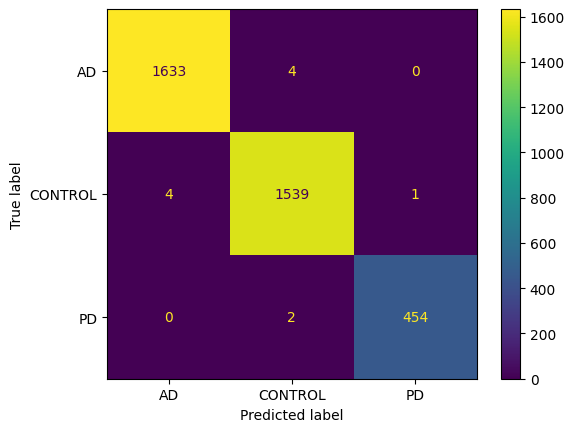

              precision    recall  f1-score   support

          AD       1.00      1.00      1.00      1637
     CONTROL       1.00      1.00      1.00      1544
          PD       1.00      1.00      1.00       456

    accuracy                           1.00      3637
   macro avg       1.00      1.00      1.00      3637
weighted avg       1.00      1.00      1.00      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 1


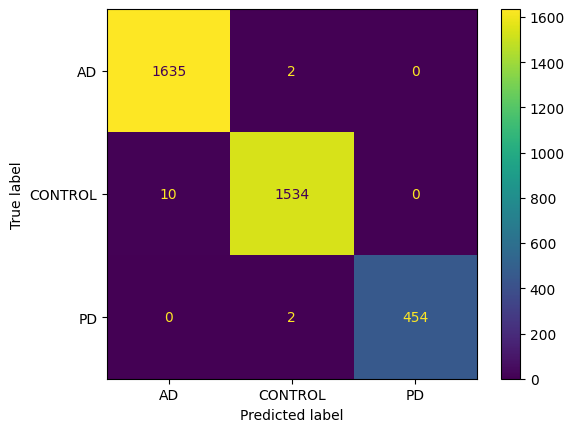

              precision    recall  f1-score   support

          AD       0.99      1.00      1.00      1637
     CONTROL       1.00      0.99      1.00      1544
          PD       1.00      1.00      1.00       456

    accuracy                           1.00      3637
   macro avg       1.00      1.00      1.00      3637
weighted avg       1.00      1.00      1.00      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 2


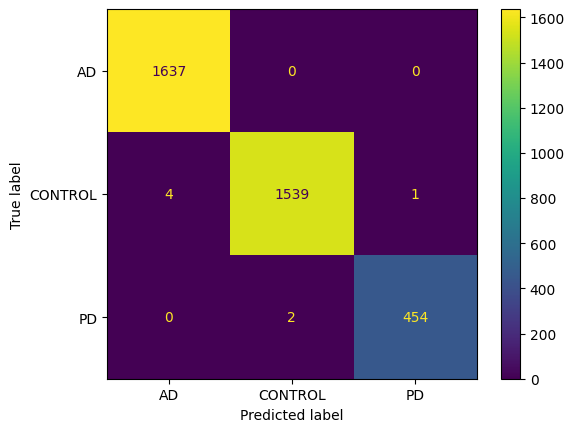

              precision    recall  f1-score   support

          AD       1.00      1.00      1.00      1637
     CONTROL       1.00      1.00      1.00      1544
          PD       1.00      1.00      1.00       456

    accuracy                           1.00      3637
   macro avg       1.00      1.00      1.00      3637
weighted avg       1.00      1.00      1.00      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 3


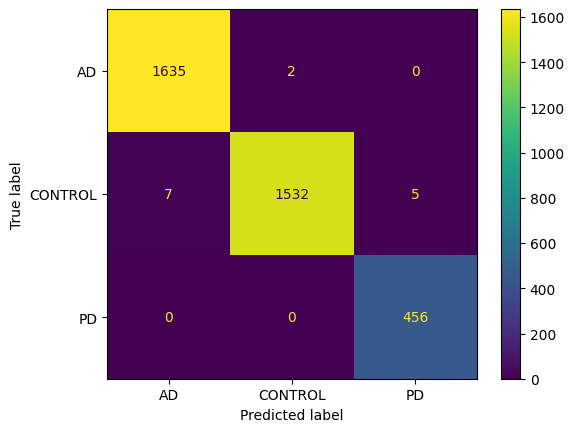

              precision    recall  f1-score   support

          AD       1.00      1.00      1.00      1637
     CONTROL       1.00      0.99      1.00      1544
          PD       0.99      1.00      0.99       456

    accuracy                           1.00      3637
   macro avg       0.99      1.00      1.00      3637
weighted avg       1.00      1.00      1.00      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 4


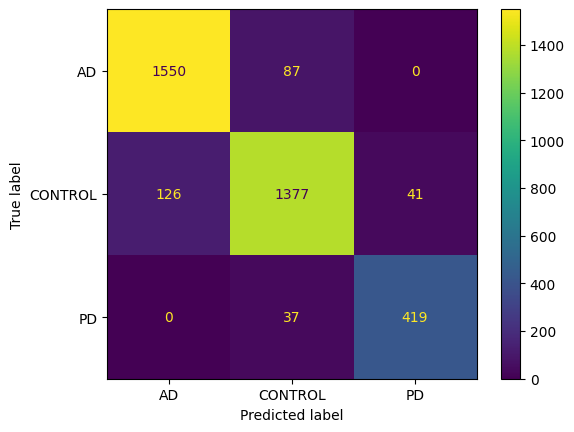

              precision    recall  f1-score   support

          AD       0.92      0.95      0.94      1637
     CONTROL       0.92      0.89      0.90      1544
          PD       0.91      0.92      0.91       456

    accuracy                           0.92      3637
   macro avg       0.92      0.92      0.92      3637
weighted avg       0.92      0.92      0.92      3637



In [ ]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model
    loaded_model = torch.load(f"mobilenetv3_small_fold{fold}.pt")
    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(val_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))

In [ ]:
classname = dataset.classes
classname

['AD', 'CONTROL', 'PD']

###Verification by sepreate data

In [ ]:
test_folder = '/content/test'

In [ ]:
# Making Dataset
from torchvision import datasets
test_dataset = datasets.ImageFolder(root=test_folder, # target folder of images
                                  transform=transforms["test"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [ ]:
len(test_dataset)

4548

In [ ]:
# Making test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

In [ ]:
test_dataset.classes

['AD', 'CONTROL', 'PD']

In [ ]:
len(test_dataloader)

569

  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 0


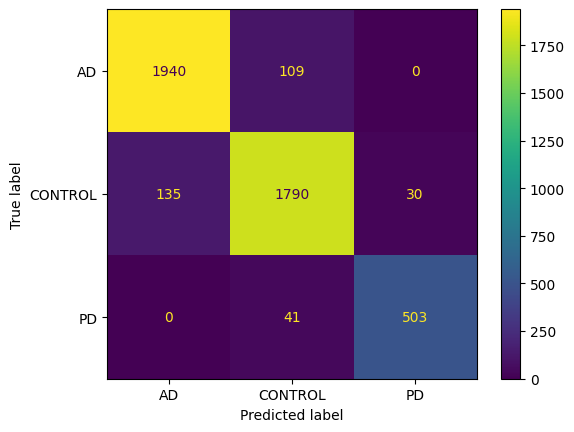

              precision    recall  f1-score   support

          AD       0.93      0.95      0.94      2049
     CONTROL       0.92      0.92      0.92      1955
          PD       0.94      0.92      0.93       544

    accuracy                           0.93      4548
   macro avg       0.93      0.93      0.93      4548
weighted avg       0.93      0.93      0.93      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 1


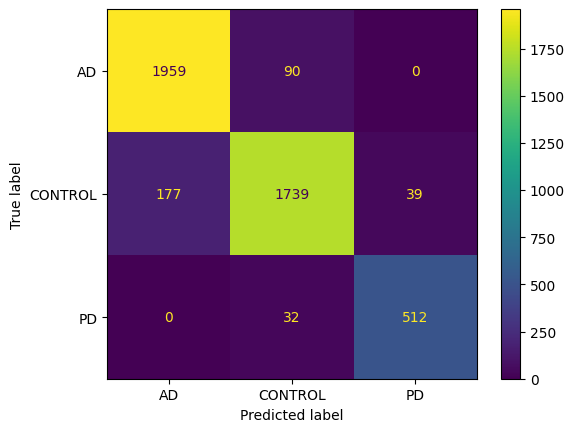

              precision    recall  f1-score   support

          AD       0.92      0.96      0.94      2049
     CONTROL       0.93      0.89      0.91      1955
          PD       0.93      0.94      0.94       544

    accuracy                           0.93      4548
   macro avg       0.93      0.93      0.93      4548
weighted avg       0.93      0.93      0.93      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 2


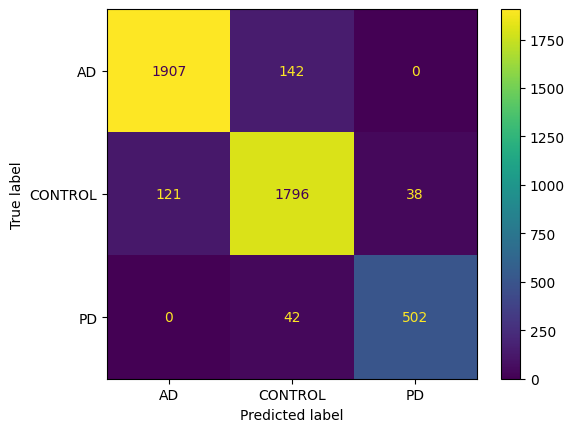

              precision    recall  f1-score   support

          AD       0.94      0.93      0.94      2049
     CONTROL       0.91      0.92      0.91      1955
          PD       0.93      0.92      0.93       544

    accuracy                           0.92      4548
   macro avg       0.93      0.92      0.92      4548
weighted avg       0.92      0.92      0.92      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 3


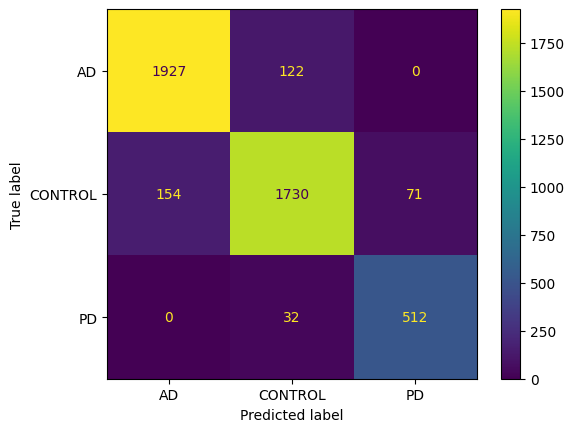

              precision    recall  f1-score   support

          AD       0.93      0.94      0.93      2049
     CONTROL       0.92      0.88      0.90      1955
          PD       0.88      0.94      0.91       544

    accuracy                           0.92      4548
   macro avg       0.91      0.92      0.91      4548
weighted avg       0.92      0.92      0.92      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 4


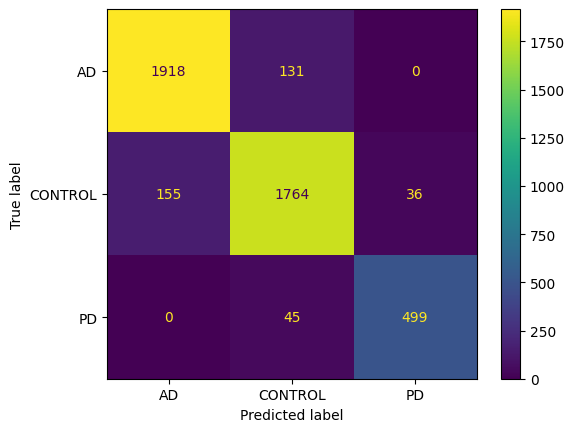

              precision    recall  f1-score   support

          AD       0.93      0.94      0.93      2049
     CONTROL       0.91      0.90      0.91      1955
          PD       0.93      0.92      0.92       544

    accuracy                           0.92      4548
   macro avg       0.92      0.92      0.92      4548
weighted avg       0.92      0.92      0.92      4548



In [ ]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model
    loaded_model = torch.load(f"mobilenetv3_small_fold{fold}.pt")
    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(test_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))

##Visualization train model result

In [ ]:
## Making Pridcition return class & prob
from typing import List, Tuple

from PIL import Image
def pred_class(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: T = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    if img.mode != 'RGB':
        img = img.convert('RGB')

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    classname =  class_names[target_image_pred_label]
    prob = target_image_pred_probs.max().cpu().numpy()

    return classname , prob

In [ ]:
##Load some model
loaded_model = torch.load('/content/mobilenetv3_small_fold4.pt')

##Train data visulization

In [ ]:
#Making df for random
import os
import pandas as pd
from PIL import Image

# create an empty list to store image paths
image_paths = []

# loop through each subfolder in the "Image" directory
for root, dirs, files in os.walk('/content/test'):
    for subfolder_name in dirs:
        # get the path to the subfolder
        subfolder_path = os.path.join(root, subfolder_name)
        # loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, filename)
            image_paths.append((image_path, subfolder_name))

# create a DataFrame from the list of image paths
df = pd.DataFrame(image_paths, columns=['path', 'subfolder_name'])


In [ ]:
df.head()

,path,subfolder_name
0,/content/test/CONTROL/CONTROLAD_1384_Rotation ...,CONTROL
1,/content/test/CONTROL/CONTROLAD_853_Zoom (10_)...,CONTROL
2,/content/test/CONTROL/CONTROL_PD_161_Zoom (10_...,CONTROL
3,/content/test/CONTROL/CONTROLAD_1683_Rotation ...,CONTROL
4,/content/test/CONTROL/CONTROLAD_2024_Rotation ...,CONTROL


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image




def sample_picture(df=df,random_state=None):
    # Sample 20 random rows from the DataFrame
    sample_df = df.sample(20, random_state=random_state).copy()
    sample_df = sample_df.reset_index(drop=True)
    # Define the grid layout for displaying the images
    num_rows = 4
    num_cols = 5
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    fig.tight_layout(pad=5.0)

    # Iterate over the sampled rows and display the images in the grid
    for i, row in sample_df.iterrows():
        img = Image.open(row['path'])

        if img.mode != 'RGB':
            img = img.convert('RGB')

        # Prediction
        pred_name , prob = pred_class(model=loaded_model,image_path=row['path'],
                   class_names = classname,
                   transform=transforms["test"])



        row_idx = i // num_cols
        col_idx = i % num_cols
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('on')
        axs[row_idx, col_idx].set_title(row['subfolder_name'] + ': \nPredict:' + pred_name + '\nProb:'+ str(prob.round(decimals=2)) )

        # prediction


    plt.show()

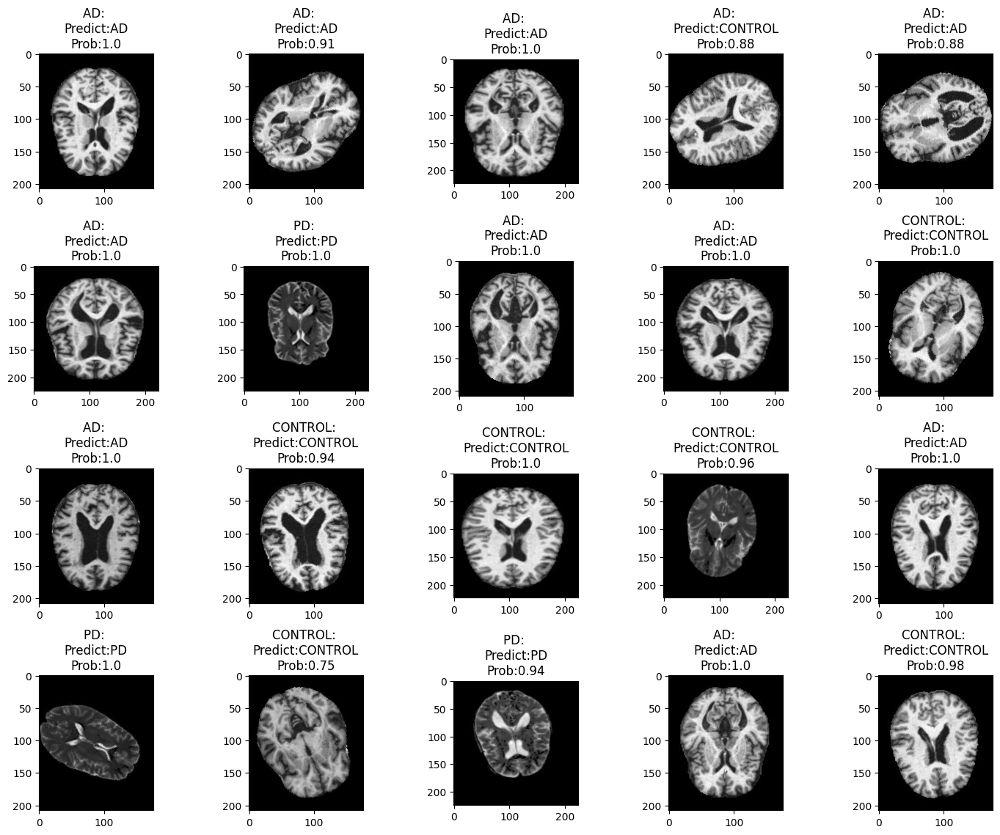

In [ ]:
sample_picture()

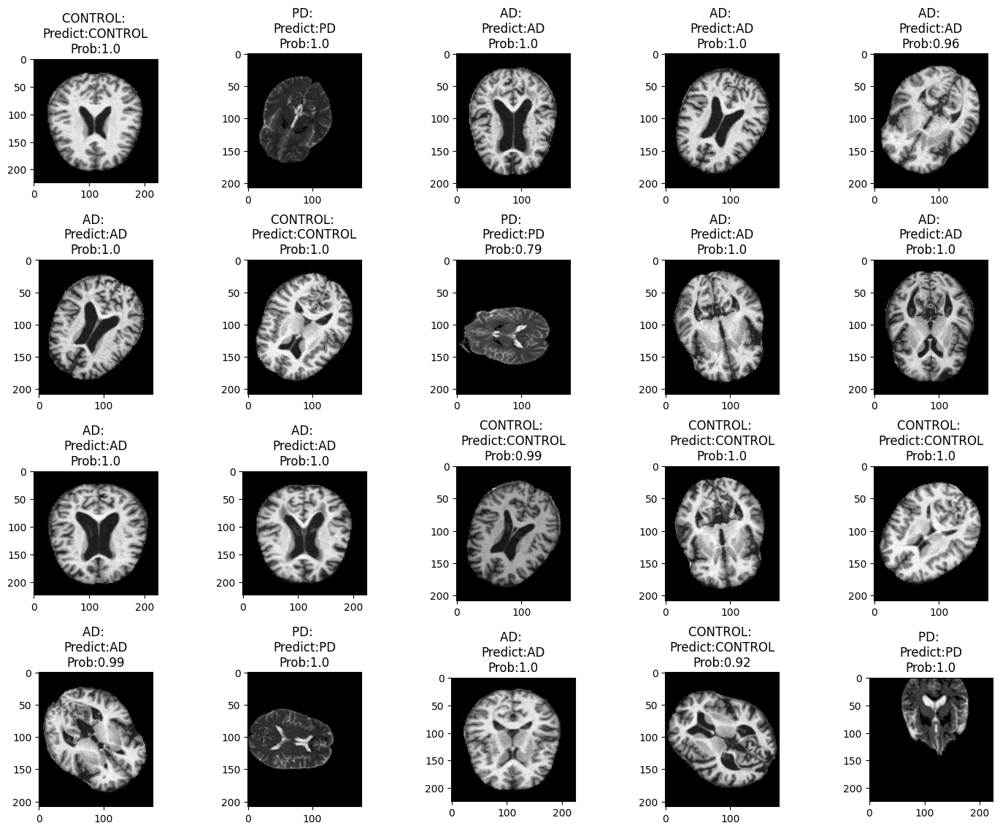

In [ ]:
sample_picture()

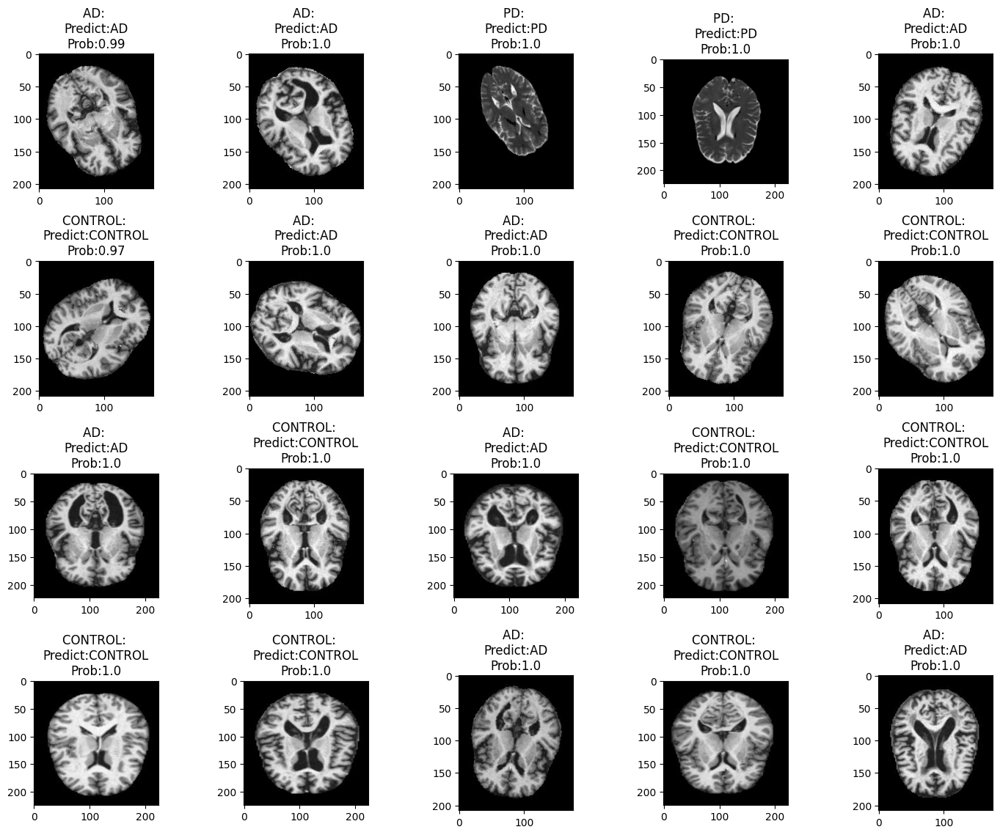

In [ ]:
sample_picture()

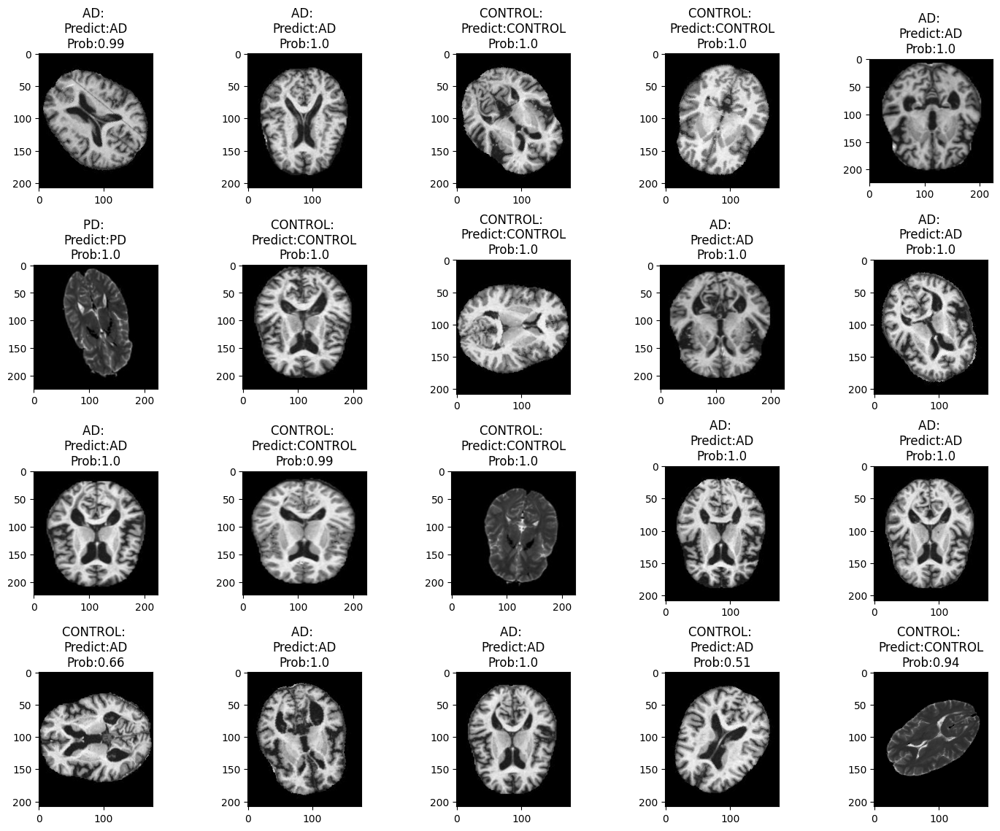

In [ ]:
sample_picture()

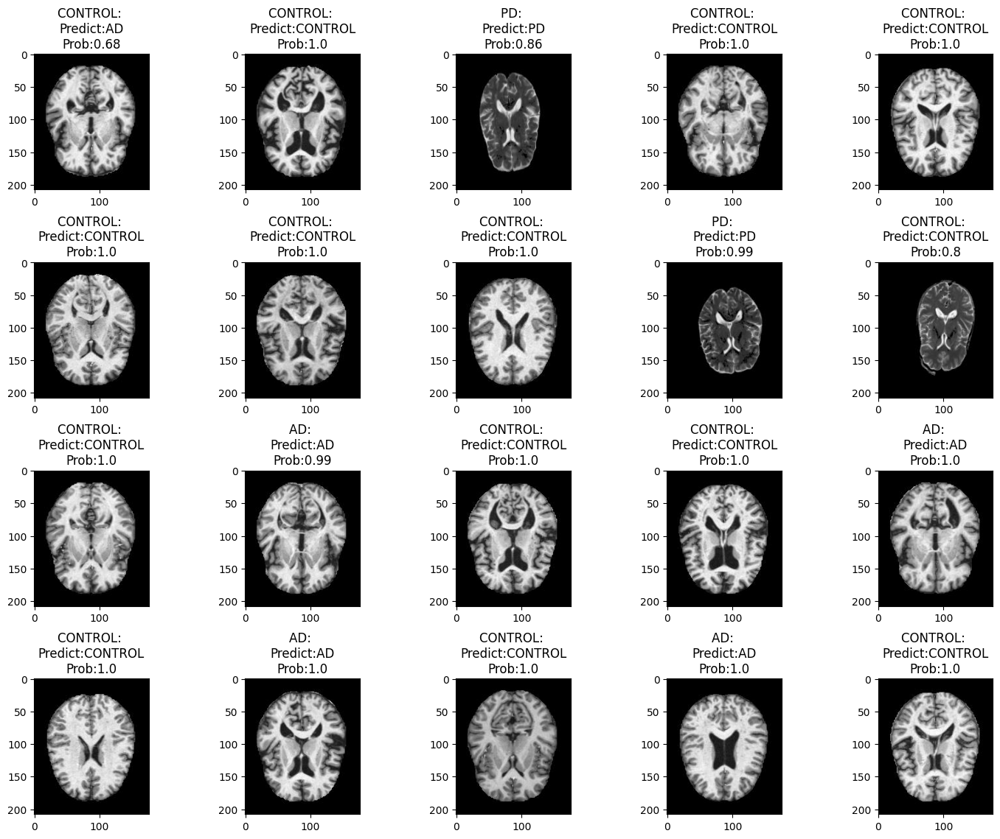

In [ ]:
sample_picture()

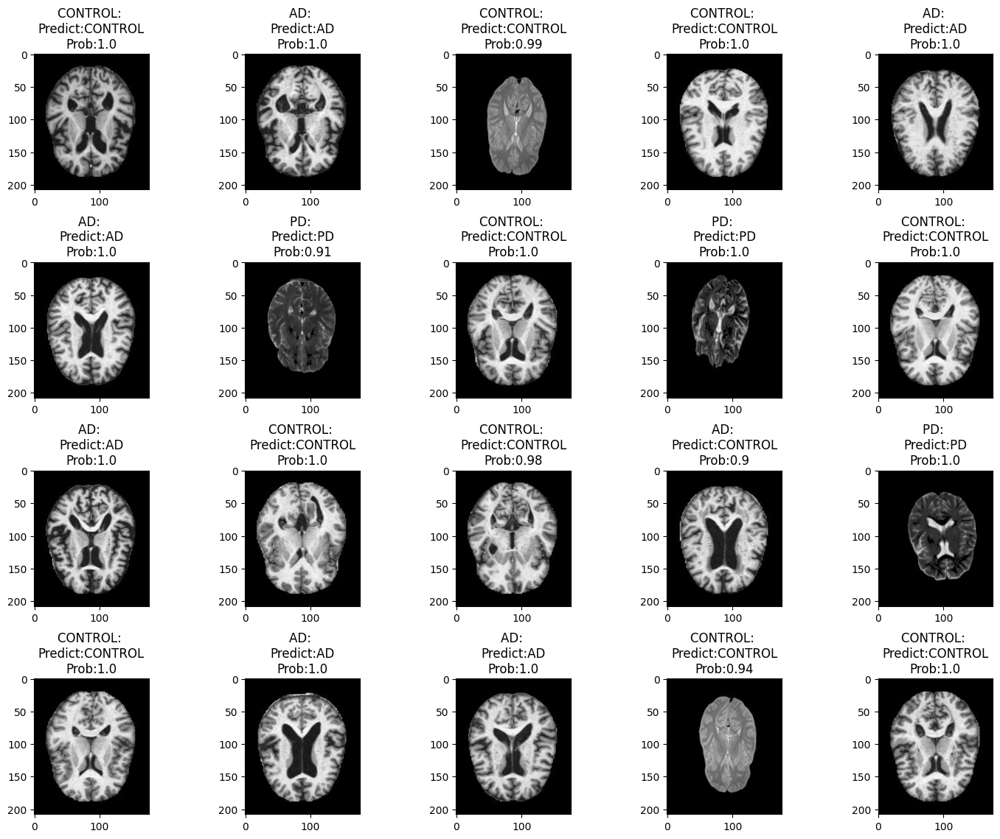

In [ ]:
sample_picture()

# Twin

In [ ]:
# Select model (List of available is shown above)
twin_svt = "hf_hub:timm/twins_svt_large.in1k"
twin_svt_model= timm.create_model(twin_svt, pretrained=True, num_classes=4)
# Print a summary using torchinfo (uncomment for actual output)
summary(model=twin_svt_model,
        input_size=(16, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/580 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/397M [00:00<?, ?B/s]

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
Twins (Twins)                                      [16, 3, 224, 224]    [16, 4]              --                   True
├─ModuleList (patch_embeds)                        --                   --                   (recursive)          True
│    └─PatchEmbed (0)                              [16, 3, 224, 224]    [16, 3136, 128]      --                   True
│    │    └─Conv2d (proj)                          [16, 3, 224, 224]    [16, 128, 56, 56]    6,272                True
│    │    └─LayerNorm (norm)                       [16, 3136, 128]      [16, 3136, 128]      256                  True
├─ModuleList (pos_drops)                           --                   --                   --                   --
│    └─Dropout (0)                                 [16, 3136, 128]      [16, 3136, 128]      --                   --
├─ModuleList (blocks)                          

In [ ]:
# Transform image data based on ImageNet's mean and std
transforms = {
    "train": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
    "test": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ])
}

In [ ]:
train_dir = '/content/Augmented_Dataset'

In [ ]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets
dataset = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=transforms["train"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [ ]:
dataset.class_to_idx

{'AD': 0, 'CONTROL': 1, 'PD': 2}

In [ ]:
len(dataset)

18187

In [ ]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
#Select Model
model_name = "hf_hub:timm/twins_svt_large.in1k"

In [ ]:
num_epochs = 5
criterion = nn.CrossEntropyLoss()

# Cross Validation Configuration
k_splits = 5
metric = evaluate.load("accuracy")

In [ ]:
kf = KFold(n_splits=k_splits, shuffle=True, random_state=42)

In [ ]:
# Gradient Accumulation Settings
# Set to 1 for no accumulation
train_batch_size = 16
eval_batch_size = 8
num_accumulate = 1

In [ ]:
torch.set_float32_matmul_precision('high')
fabric = Fabric(accelerator="cuda", precision="16-mixed")
fabric.launch()

INFO: Using 16-bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16-bit Automatic Mixed Precision (AMP)


In [ ]:
import time

In [ ]:
%%time
all_eval_scores = []

for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
    print(f"Fold {fold+1} of {k_splits}")

    # Load Model
    model = timm.create_model(model_name, pretrained=True, num_classes=4)


    # Load Optimizer and Scheduler
    optimizer = timm.optim.create_optimizer_v2(model, opt="AdamW", lr=5e-4)
    # optimizer = timm.optim.Lookahead(optimizer, alpha=0.5, k=6)    # update the slow weight every k steps
                                                                   # update the optimizer by combine slow weight and fast weight * alpha

    model, optimizer = fabric.setup(model, optimizer)

    scheduler = timm.scheduler.create_scheduler_v2(optimizer, num_epochs=num_epochs)[0]

    # Load Data: split train and valition set based on kfold
    train_dataset = torch.utils.data.Subset(dataset, train_idx)
    val_dataset = torch.utils.data.Subset(dataset, val_idx)

    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_dataloader = DataLoader(val_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

    train_dataloader, val_dataloader = fabric.setup_dataloaders(train_dataloader, val_dataloader)

    # Reset Model Info
    info = {
        "metric_train": [],
        "metric_val": [],
        "train_loss": [],
        "val_loss": [],
        "best_metric_val": -999,
        "best_val_loss": 999,
    }

    for epoch in range(num_epochs):
        train_loss_epoch = []
        val_loss_epoch = []

        train_preds = []
        train_targets = []

        val_preds = []
        val_targets = []

        num_updates = epoch * len(train_dataloader)

        ### === Train Loop === ###
        ## Time
        s1 = time.time()

        model.train()
        for idx, batch in enumerate(tqdm(train_dataloader)):
            inputs, targets = batch
            # inputs = {k: v.to(device) for k,v in inputs.items()}
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            fabric.backward(loss)

            # === Gradient Accumulation === #
            if ((idx + 1) % num_accumulate == 0) or (idx + 1 == len(train_dataloader)):
                optimizer.step()
                scheduler.step_update(num_updates=num_updates)
                optimizer.zero_grad()
            # ============================= #

            train_loss_epoch.append(loss.item())
            train_preds += outputs.argmax(-1).detach().cpu().tolist()
            train_targets += targets.tolist()
        ### ==================== ###

        # optimizer.sync_lookahead()              # Sync slow weight and fast weight
        scheduler.step(epoch + 1)

        ### === Evaluation Loop === ###
        model.eval()
        with torch.no_grad():
            for batch in tqdm(val_dataloader):
                inputs, targets = batch
                # inputs = {k: v.to(device) for k,v in inputs.items()}
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                # Log Values
                val_loss_epoch.append(loss.item())
                val_preds += outputs.argmax(-1).detach().cpu().tolist()
                val_targets += targets.tolist()
        ### ======================= ###
        ## Time train finish
        s2 = time.time()
        elapsed_time = s2 - s1


        # Log Data
        metric_train = metric.compute(predictions=train_preds, references=train_targets)["accuracy"]
        metric_val = metric.compute(predictions=val_preds, references=val_targets)["accuracy"]

        info["metric_train"].append(metric_train)
        info["metric_val"].append(metric_val)

        info["train_loss"].append(np.average(train_loss_epoch))
        info["val_loss"].append(np.average(val_loss_epoch))

        if metric_val > info["best_metric_val"]:
        # if info["val_loss"][-1] < info["best_val_loss"]:
            print("New Best Score!")
            # print("New Best Val Loss")
            info["best_metric_val"] = metric_val
            # info["best_val_loss"] = info["val_loss"][-1]
            torch.save(model, f"twin_svt_fold{fold}.pt")

        print(f"Using time of Fold: {fold} | Epoch: {epoch} | {elapsed_time} second ")
        print(info)
        print(f"Fold: {fold} | Epoch: {epoch} | Metric: {metric_val} | Training Loss: {np.average(train_loss_epoch)} | Validation Loss: {np.average(val_loss_epoch)}")

    # save all best metric val
    all_eval_scores.append(info["best_metric_val"])


Fold 1 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 0 | 218.14458656311035 second 
{'metric_train': [0.5832703278575847], 'metric_val': [0.5896096756459593], 'train_loss': [0.7281994998782546], 'val_loss': [0.7136603069829417], 'best_metric_val': 0.5896096756459593, 'best_val_loss': 999}
Fold: 0 | Epoch: 0 | Metric: 0.5896096756459593 | Training Loss: 0.7281994998782546 | Validation Loss: 0.7136603069829417


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 1 | 217.45190000534058 second 
{'metric_train': [0.5832703278575847, 0.6215547460306551], 'metric_val': [0.5896096756459593, 0.6511819681143486], 'train_loss': [0.7281994998782546, 0.698098125726312], 'val_loss': [0.7136603069829417, 0.6549643205417381], 'best_metric_val': 0.6511819681143486, 'best_val_loss': 999}
Fold: 0 | Epoch: 1 | Metric: 0.6511819681143486 | Training Loss: 0.698098125726312 | Validation Loss: 0.6549643205417381


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 0 | Epoch: 2 | 217.79510259628296 second 
{'metric_train': [0.5832703278575847, 0.6215547460306551, 0.6694618186816963], 'metric_val': [0.5896096756459593, 0.6511819681143486, 0.6443100604727873], 'train_loss': [0.7281994998782546, 0.698098125726312, 0.6380654650730091], 'val_loss': [0.7136603069829417, 0.6549643205417381, 0.6299768243517194], 'best_metric_val': 0.6511819681143486, 'best_val_loss': 999}
Fold: 0 | Epoch: 2 | Metric: 0.6443100604727873 | Training Loss: 0.6380654650730091 | Validation Loss: 0.6299768243517194


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 3 | 218.03562307357788 second 
{'metric_train': [0.5832703278575847, 0.6215547460306551, 0.6694618186816963, 0.6743418791669531], 'metric_val': [0.5896096756459593, 0.6511819681143486, 0.6443100604727873, 0.6786695986805937], 'train_loss': [0.7281994998782546, 0.698098125726312, 0.6380654650730091, 0.6305160417334064], 'val_loss': [0.7136603069829417, 0.6549643205417381, 0.6299768243517194, 0.6242715481545899], 'best_metric_val': 0.6786695986805937, 'best_val_loss': 999}
Fold: 0 | Epoch: 3 | Metric: 0.6786695986805937 | Training Loss: 0.6305160417334064 | Validation Loss: 0.6242715481545899


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 4 | 217.80791664123535 second 
{'metric_train': [0.5832703278575847, 0.6215547460306551, 0.6694618186816963, 0.6743418791669531, 0.6876073956972988], 'metric_val': [0.5896096756459593, 0.6511819681143486, 0.6443100604727873, 0.6786695986805937, 0.6836173721825178], 'train_loss': [0.7281994998782546, 0.698098125726312, 0.6380654650730091, 0.6305160417334064, 0.6105610817015826], 'val_loss': [0.7136603069829417, 0.6549643205417381, 0.6299768243517194, 0.6242715481545899, 0.6096257107925939], 'best_metric_val': 0.6836173721825178, 'best_val_loss': 999}
Fold: 0 | Epoch: 4 | Metric: 0.6836173721825178 | Training Loss: 0.6105610817015826 | Validation Loss: 0.6096257107925939
Fold 2 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 0 | 218.3086199760437 second 
{'metric_train': [0.5914495841638601], 'metric_val': [0.602803738317757], 'train_loss': [0.7238149383565882], 'val_loss': [0.6833827696658753], 'best_metric_val': 0.602803738317757, 'best_val_loss': 999}
Fold: 1 | Epoch: 0 | Metric: 0.602803738317757 | Training Loss: 0.7238149383565882 | Validation Loss: 0.6833827696658753


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 1 | Epoch: 1 | 217.11624217033386 second 
{'metric_train': [0.5914495841638601, 0.6233418104337067], 'metric_val': [0.602803738317757, 0.5876855415063221], 'train_loss': [0.7238149383565882, 0.6930913706402202], 'val_loss': [0.6833827696658753, 0.7009567144807879], 'best_metric_val': 0.602803738317757, 'best_val_loss': 999}
Fold: 1 | Epoch: 1 | Metric: 0.5876855415063221 | Training Loss: 0.6930913706402202 | Validation Loss: 0.7009567144807879


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 2 | 216.90869808197021 second 
{'metric_train': [0.5914495841638601, 0.6233418104337067, 0.6667812220771187], 'metric_val': [0.602803738317757, 0.5876855415063221, 0.6341396371632765], 'train_loss': [0.7238149383565882, 0.6930913706402202, 0.6478886585641693], 'val_loss': [0.6833827696658753, 0.7009567144807879, 0.6400603938888717], 'best_metric_val': 0.6341396371632765, 'best_val_loss': 999}
Fold: 1 | Epoch: 2 | Metric: 0.6341396371632765 | Training Loss: 0.6478886585641693 | Validation Loss: 0.6400603938888717


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 3 | 217.04551768302917 second 
{'metric_train': [0.5914495841638601, 0.6233418104337067, 0.6667812220771187, 0.68149013677916], 'metric_val': [0.602803738317757, 0.5876855415063221, 0.6341396371632765, 0.6836173721825178], 'train_loss': [0.7238149383565882, 0.6930913706402202, 0.6478886585641693, 0.6146237900951407], 'val_loss': [0.6833827696658753, 0.7009567144807879, 0.6400603938888717, 0.6202536700846075], 'best_metric_val': 0.6836173721825178, 'best_val_loss': 999}
Fold: 1 | Epoch: 3 | Metric: 0.6836173721825178 | Training Loss: 0.6146237900951407 | Validation Loss: 0.6202536700846075


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 4 | 216.6929383277893 second 
{'metric_train': [0.5914495841638601, 0.6233418104337067, 0.6667812220771187, 0.68149013677916, 0.6911127912571311], 'metric_val': [0.602803738317757, 0.5876855415063221, 0.6341396371632765, 0.6836173721825178, 0.6896646509070918], 'train_loss': [0.7238149383565882, 0.6930913706402202, 0.6478886585641693, 0.6146237900951407, 0.5988649299839041], 'val_loss': [0.6833827696658753, 0.7009567144807879, 0.6400603938888717, 0.6202536700846075, 0.6064597673141039], 'best_metric_val': 0.6896646509070918, 'best_val_loss': 999}
Fold: 1 | Epoch: 4 | Metric: 0.6896646509070918 | Training Loss: 0.5988649299839041 | Validation Loss: 0.6064597673141039
Fold 3 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 0 | 217.97142720222473 second 
{'metric_train': [0.5941580756013746], 'metric_val': [0.6975529282375584], 'train_loss': [0.707625205732964], 'val_loss': [0.6007906248936287], 'best_metric_val': 0.6975529282375584, 'best_val_loss': 999}
Fold: 2 | Epoch: 0 | Metric: 0.6975529282375584 | Training Loss: 0.707625205732964 | Validation Loss: 0.6007906248936287


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 2 | Epoch: 1 | 217.24483251571655 second 
{'metric_train': [0.5941580756013746, 0.670171821305842], 'metric_val': [0.6975529282375584, 0.6950783612867748], 'train_loss': [0.707625205732964, 0.6371224724656933], 'val_loss': [0.6007906248936287, 0.625781532892814], 'best_metric_val': 0.6975529282375584, 'best_val_loss': 999}
Fold: 2 | Epoch: 1 | Metric: 0.6950783612867748 | Training Loss: 0.6371224724656933 | Validation Loss: 0.625781532892814


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 2 | Epoch: 2 | 217.43265795707703 second 
{'metric_train': [0.5941580756013746, 0.670171821305842, 0.6783505154639176], 'metric_val': [0.6975529282375584, 0.6950783612867748, 0.6857299972504811], 'train_loss': [0.707625205732964, 0.6371224724656933, 0.6274137655457298], 'val_loss': [0.6007906248936287, 0.625781532892814, 0.6102115952706599], 'best_metric_val': 0.6975529282375584, 'best_val_loss': 999}
Fold: 2 | Epoch: 2 | Metric: 0.6857299972504811 | Training Loss: 0.6274137655457298 | Validation Loss: 0.6102115952706599


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 3 | 217.87825179100037 second 
{'metric_train': [0.5941580756013746, 0.670171821305842, 0.6783505154639176, 0.6890721649484536], 'metric_val': [0.6975529282375584, 0.6950783612867748, 0.6857299972504811, 0.7044267253230685], 'train_loss': [0.707625205732964, 0.6371224724656933, 0.6274137655457298, 0.6031814763834188], 'val_loss': [0.6007906248936287, 0.625781532892814, 0.6102115952706599, 0.5837361327239445], 'best_metric_val': 0.7044267253230685, 'best_val_loss': 999}
Fold: 2 | Epoch: 3 | Metric: 0.7044267253230685 | Training Loss: 0.6031814763834188 | Validation Loss: 0.5837361327239445


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 2 | Epoch: 4 | 217.78813695907593 second 
{'metric_train': [0.5941580756013746, 0.670171821305842, 0.6783505154639176, 0.6890721649484536, 0.6978694158075601], 'metric_val': [0.6975529282375584, 0.6950783612867748, 0.6857299972504811, 0.7044267253230685, 0.7022271102557053], 'train_loss': [0.707625205732964, 0.6371224724656933, 0.6274137655457298, 0.6031814763834188, 0.5859193940411557], 'val_loss': [0.6007906248936287, 0.625781532892814, 0.6102115952706599, 0.5837361327239445, 0.5784990166242306], 'best_metric_val': 0.7044267253230685, 'best_val_loss': 999}
Fold: 2 | Epoch: 4 | Metric: 0.7022271102557053 | Training Loss: 0.5859193940411557 | Validation Loss: 0.5784990166242306
Fold 4 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 0 | 217.41477870941162 second 
{'metric_train': [0.5505154639175258], 'metric_val': [0.6189166895793237], 'train_loss': [0.7822727821357958], 'val_loss': [0.6830013704496426], 'best_metric_val': 0.6189166895793237, 'best_val_loss': 999}
Fold: 3 | Epoch: 0 | Metric: 0.6189166895793237 | Training Loss: 0.7822727821357958 | Validation Loss: 0.6830013704496426


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 1 | 217.72309732437134 second 
{'metric_train': [0.5505154639175258, 0.6506529209621993], 'metric_val': [0.6189166895793237, 0.6708825955457794], 'train_loss': [0.7822727821357958, 0.660638362300265], 'val_loss': [0.6830013704496426, 0.6333341080736328], 'best_metric_val': 0.6708825955457794, 'best_val_loss': 999}
Fold: 3 | Epoch: 1 | Metric: 0.6708825955457794 | Training Loss: 0.660638362300265 | Validation Loss: 0.6333341080736328


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 2 | 217.6269793510437 second 
{'metric_train': [0.5505154639175258, 0.6506529209621993, 0.6745017182130584], 'metric_val': [0.6189166895793237, 0.6708825955457794, 0.6879296123178443], 'train_loss': [0.7822727821357958, 0.660638362300265, 0.6232930632574217], 'val_loss': [0.6830013704496426, 0.6333341080736328, 0.619823900290898], 'best_metric_val': 0.6879296123178443, 'best_val_loss': 999}
Fold: 3 | Epoch: 2 | Metric: 0.6879296123178443 | Training Loss: 0.6232930632574217 | Validation Loss: 0.619823900290898


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 3 | Epoch: 3 | 217.4369761943817 second 
{'metric_train': [0.5505154639175258, 0.6506529209621993, 0.6745017182130584, 0.6850171821305842], 'metric_val': [0.6189166895793237, 0.6708825955457794, 0.6879296123178443, 0.6840802859499587], 'train_loss': [0.7822727821357958, 0.660638362300265, 0.6232930632574217, 0.6108882341083589], 'val_loss': [0.6830013704496426, 0.6333341080736328, 0.619823900290898, 0.6099727966628232], 'best_metric_val': 0.6879296123178443, 'best_val_loss': 999}
Fold: 3 | Epoch: 3 | Metric: 0.6840802859499587 | Training Loss: 0.6108882341083589 | Validation Loss: 0.6099727966628232


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 4 | 217.9518587589264 second 
{'metric_train': [0.5505154639175258, 0.6506529209621993, 0.6745017182130584, 0.6850171821305842, 0.6881786941580756], 'metric_val': [0.6189166895793237, 0.6708825955457794, 0.6879296123178443, 0.6840802859499587, 0.6981028320043993], 'train_loss': [0.7822727821357958, 0.660638362300265, 0.6232930632574217, 0.6108882341083589, 0.596097986645751], 'val_loss': [0.6830013704496426, 0.6333341080736328, 0.619823900290898, 0.6099727966628232, 0.5921377097839837], 'best_metric_val': 0.6981028320043993, 'best_val_loss': 999}
Fold: 3 | Epoch: 4 | Metric: 0.6981028320043993 | Training Loss: 0.596097986645751 | Validation Loss: 0.5921377097839837
Fold 5 of 5


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 0 | 217.60565781593323 second 
{'metric_train': [0.5400687285223368], 'metric_val': [0.5589771789936762], 'train_loss': [0.7469717611323347], 'val_loss': [0.7066562319849874], 'best_metric_val': 0.5589771789936762, 'best_val_loss': 999}
Fold: 4 | Epoch: 0 | Metric: 0.5589771789936762 | Training Loss: 0.7469717611323347 | Validation Loss: 0.7066562319849874


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 1 | 217.4142782688141 second 
{'metric_train': [0.5400687285223368, 0.5650859106529209], 'metric_val': [0.5589771789936762, 0.5740995325817981], 'train_loss': [0.7469717611323347, 0.7072303552548964], 'val_loss': [0.7066562319849874, 0.7039168894290924], 'best_metric_val': 0.5740995325817981, 'best_val_loss': 999}
Fold: 4 | Epoch: 1 | Metric: 0.5740995325817981 | Training Loss: 0.7072303552548964 | Validation Loss: 0.7039168894290924


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 4 | Epoch: 2 | 217.1031210422516 second 
{'metric_train': [0.5400687285223368, 0.5650859106529209, 0.5698969072164949], 'metric_val': [0.5589771789936762, 0.5740995325817981, 0.5633764091284025], 'train_loss': [0.7469717611323347, 0.7072303552548964, 0.6950000577903056], 'val_loss': [0.7066562319849874, 0.7039168894290924, 0.6929437256121374], 'best_metric_val': 0.5740995325817981, 'best_val_loss': 999}
Fold: 4 | Epoch: 2 | Metric: 0.5633764091284025 | Training Loss: 0.6950000577903056 | Validation Loss: 0.6929437256121374


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

Using time of Fold: 4 | Epoch: 3 | 216.8677749633789 second 
{'metric_train': [0.5400687285223368, 0.5650859106529209, 0.5698969072164949, 0.5717525773195876], 'metric_val': [0.5589771789936762, 0.5740995325817981, 0.5633764091284025, 0.5721748693978553], 'train_loss': [0.7469717611323347, 0.7072303552548964, 0.6950000577903056, 0.686159352679829], 'val_loss': [0.7066562319849874, 0.7039168894290924, 0.6929437256121374, 0.6844125967104356], 'best_metric_val': 0.5740995325817981, 'best_val_loss': 999}
Fold: 4 | Epoch: 3 | Metric: 0.5721748693978553 | Training Loss: 0.686159352679829 | Validation Loss: 0.6844125967104356


  0%|          | 0/910 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/455 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 4 | 216.93087911605835 second 
{'metric_train': [0.5400687285223368, 0.5650859106529209, 0.5698969072164949, 0.5717525773195876, 0.5817182130584192], 'metric_val': [0.5589771789936762, 0.5740995325817981, 0.5633764091284025, 0.5721748693978553, 0.5809733296673082], 'train_loss': [0.7469717611323347, 0.7072303552548964, 0.6950000577903056, 0.686159352679829, 0.6786562174886137], 'val_loss': [0.7066562319849874, 0.7039168894290924, 0.6929437256121374, 0.6844125967104356, 0.6749544342795571], 'best_metric_val': 0.5809733296673082, 'best_val_loss': 999}
Fold: 4 | Epoch: 4 | Metric: 0.5809733296673082 | Training Loss: 0.6786562174886137 | Validation Loss: 0.6749544342795571
CPU times: user 1h 27min 52s, sys: 6min 30s, total: 1h 34min 23s
Wall time: 1h 31min 3s


In [ ]:
classname = dataset.classes
classname

['AD', 'CONTROL', 'PD']

  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 0


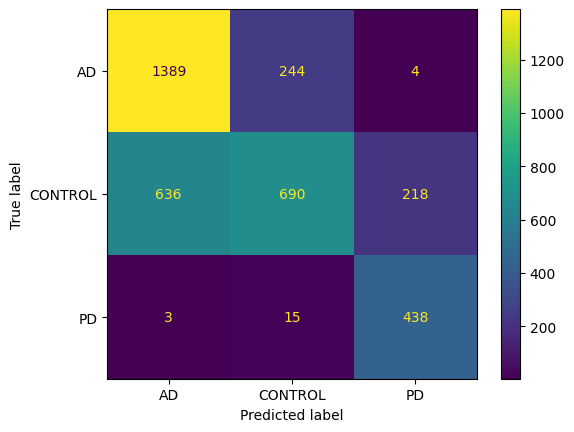

              precision    recall  f1-score   support

          AD       0.68      0.85      0.76      1637
     CONTROL       0.73      0.45      0.55      1544
          PD       0.66      0.96      0.78       456

    accuracy                           0.69      3637
   macro avg       0.69      0.75      0.70      3637
weighted avg       0.70      0.69      0.67      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 1


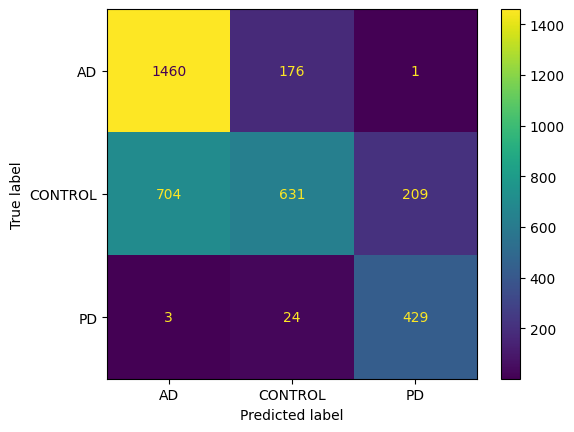

              precision    recall  f1-score   support

          AD       0.67      0.89      0.77      1637
     CONTROL       0.76      0.41      0.53      1544
          PD       0.67      0.94      0.78       456

    accuracy                           0.69      3637
   macro avg       0.70      0.75      0.69      3637
weighted avg       0.71      0.69      0.67      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 2


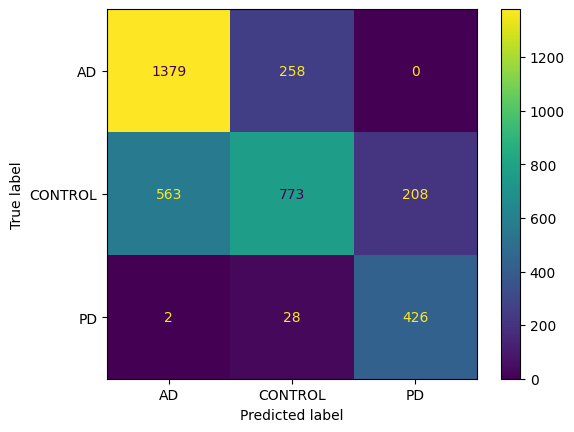

              precision    recall  f1-score   support

          AD       0.71      0.84      0.77      1637
     CONTROL       0.73      0.50      0.59      1544
          PD       0.67      0.93      0.78       456

    accuracy                           0.71      3637
   macro avg       0.70      0.76      0.72      3637
weighted avg       0.71      0.71      0.70      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 3


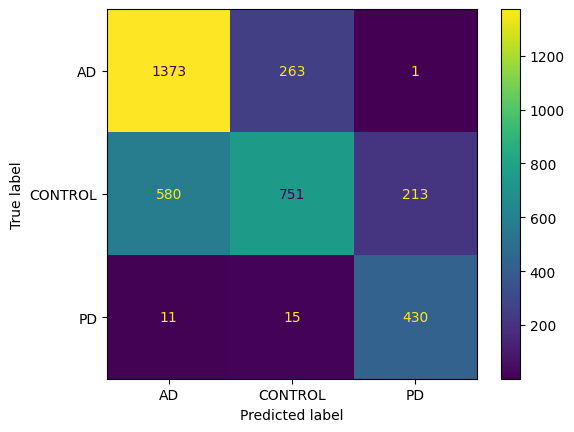

              precision    recall  f1-score   support

          AD       0.70      0.84      0.76      1637
     CONTROL       0.73      0.49      0.58      1544
          PD       0.67      0.94      0.78       456

    accuracy                           0.70      3637
   macro avg       0.70      0.76      0.71      3637
weighted avg       0.71      0.70      0.69      3637



  0%|          | 0/455 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 4


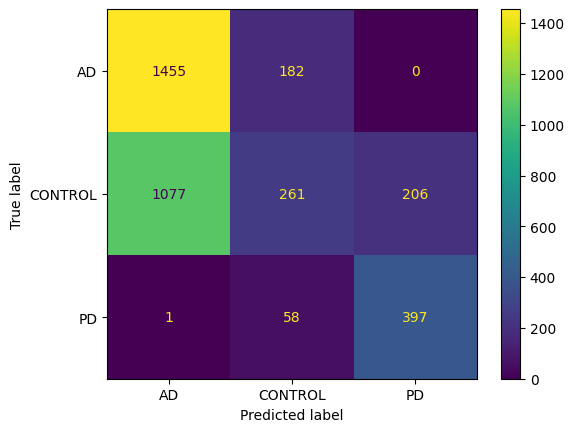

              precision    recall  f1-score   support

          AD       0.57      0.89      0.70      1637
     CONTROL       0.52      0.17      0.26      1544
          PD       0.66      0.87      0.75       456

    accuracy                           0.58      3637
   macro avg       0.58      0.64      0.57      3637
weighted avg       0.56      0.58      0.52      3637



In [ ]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model
    loaded_model = torch.load(f"twin_svt_fold{fold}.pt")

    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(val_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))

In [ ]:
test_folder = '/content/test'

In [ ]:
# Making Dataset
from torchvision import datasets
test_dataset = datasets.ImageFolder(root=test_folder, # target folder of images
                                  transform=transforms["test"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [ ]:
test_dataloader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 0


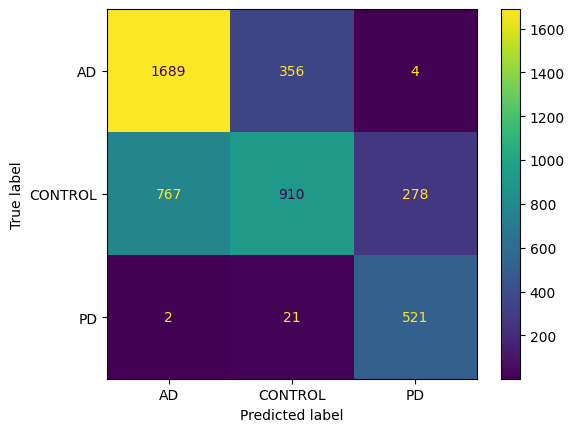

              precision    recall  f1-score   support

          AD       0.69      0.82      0.75      2049
     CONTROL       0.71      0.47      0.56      1955
          PD       0.65      0.96      0.77       544

    accuracy                           0.69      4548
   macro avg       0.68      0.75      0.69      4548
weighted avg       0.69      0.69      0.67      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 1


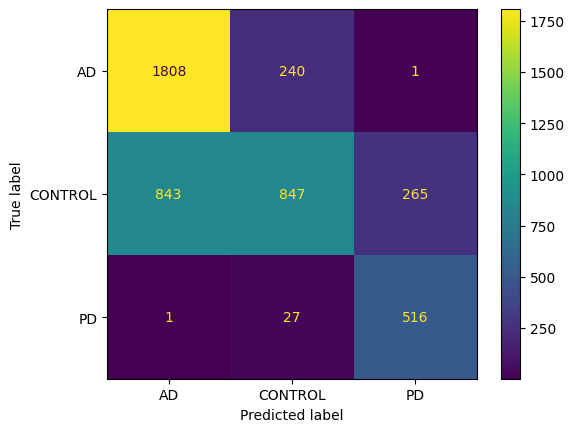

              precision    recall  f1-score   support

          AD       0.68      0.88      0.77      2049
     CONTROL       0.76      0.43      0.55      1955
          PD       0.66      0.95      0.78       544

    accuracy                           0.70      4548
   macro avg       0.70      0.75      0.70      4548
weighted avg       0.71      0.70      0.68      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 2


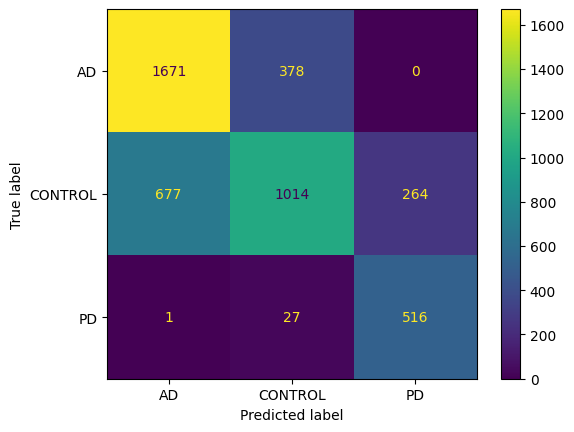

              precision    recall  f1-score   support

          AD       0.71      0.82      0.76      2049
     CONTROL       0.71      0.52      0.60      1955
          PD       0.66      0.95      0.78       544

    accuracy                           0.70      4548
   macro avg       0.70      0.76      0.71      4548
weighted avg       0.71      0.70      0.69      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 3


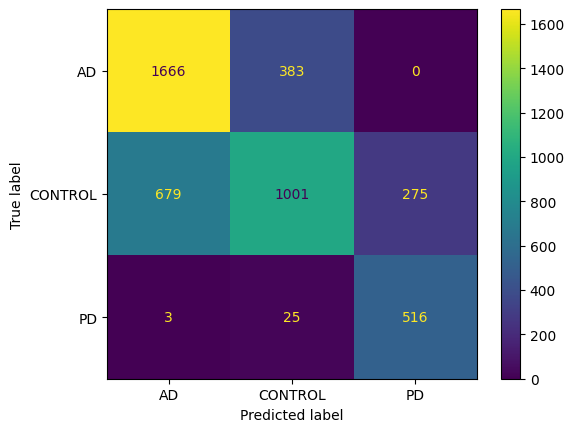

              precision    recall  f1-score   support

          AD       0.71      0.81      0.76      2049
     CONTROL       0.71      0.51      0.60      1955
          PD       0.65      0.95      0.77       544

    accuracy                           0.70      4548
   macro avg       0.69      0.76      0.71      4548
weighted avg       0.70      0.70      0.69      4548



  0%|          | 0/569 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Fold: 4


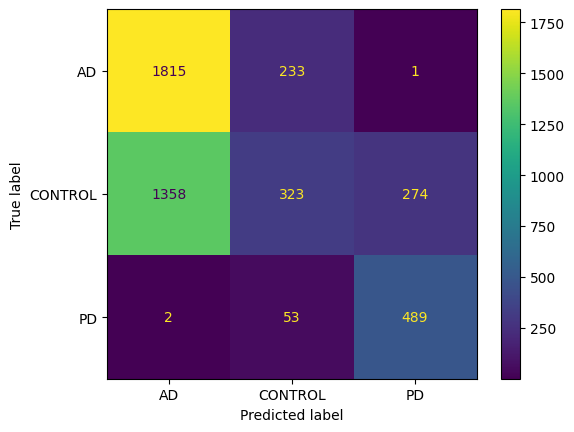

              precision    recall  f1-score   support

          AD       0.57      0.89      0.69      2049
     CONTROL       0.53      0.17      0.25      1955
          PD       0.64      0.90      0.75       544

    accuracy                           0.58      4548
   macro avg       0.58      0.65      0.56      4548
weighted avg       0.56      0.58      0.51      4548



In [ ]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model
    loaded_model = torch.load(f"twin_svt_fold{fold}.pt")
    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(test_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))

In [ ]:
## Making Pridcition return class & prob
from typing import List, Tuple

from PIL import Image
def pred_class(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: T = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    if img.mode != 'RGB':
        img = img.convert('RGB')

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    classname =  class_names[target_image_pred_label]
    prob = target_image_pred_probs.max().cpu().numpy()

    return classname , prob

In [ ]:
##Load some model
loaded_model = torch.load('/content/twin_svt_fold4.pt')

In [ ]:
#Making df for random
import os
import pandas as pd
from PIL import Image

# create an empty list to store image paths
image_paths = []

# loop through each subfolder in the "Image" directory
for root, dirs, files in os.walk('/content/test'):
    for subfolder_name in dirs:
        # get the path to the subfolder
        subfolder_path = os.path.join(root, subfolder_name)
        # loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, filename)
            image_paths.append((image_path, subfolder_name))

# create a DataFrame from the list of image paths
df = pd.DataFrame(image_paths, columns=['path', 'subfolder_name'])


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image




def sample_picture(df=df,random_state=None):
    # Sample 20 random rows from the DataFrame
    sample_df = df.sample(20, random_state=random_state).copy()
    sample_df = sample_df.reset_index(drop=True)
    # Define the grid layout for displaying the images
    num_rows = 4
    num_cols = 5
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    fig.tight_layout(pad=5.0)

    # Iterate over the sampled rows and display the images in the grid
    for i, row in sample_df.iterrows():
        img = Image.open(row['path'])

        if img.mode != 'RGB':
            img = img.convert('RGB')

        # Prediction
        pred_name , prob = pred_class(model=loaded_model,image_path=row['path'],
                   class_names = classname,
                   transform=transforms["test"])



        row_idx = i // num_cols
        col_idx = i % num_cols
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('on')
        axs[row_idx, col_idx].set_title(row['subfolder_name'] + ': \nPredict:' + pred_name + '\nProb:'+ str(prob.round(decimals=2)) )

        # prediction


    plt.show()

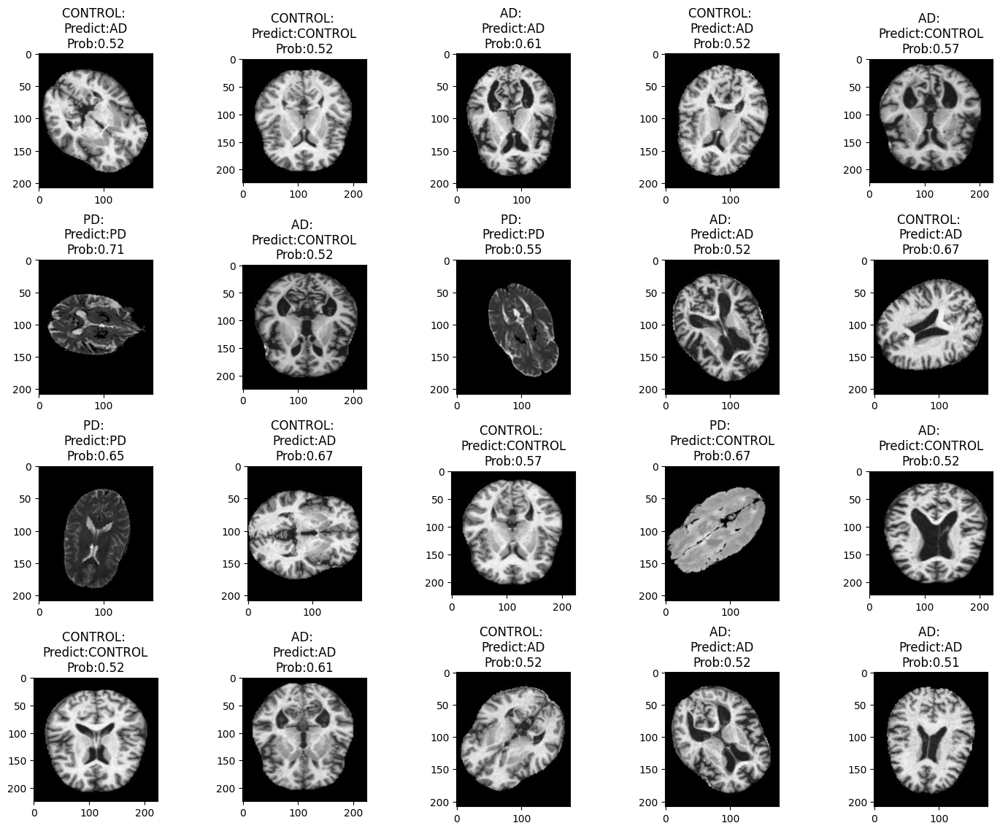

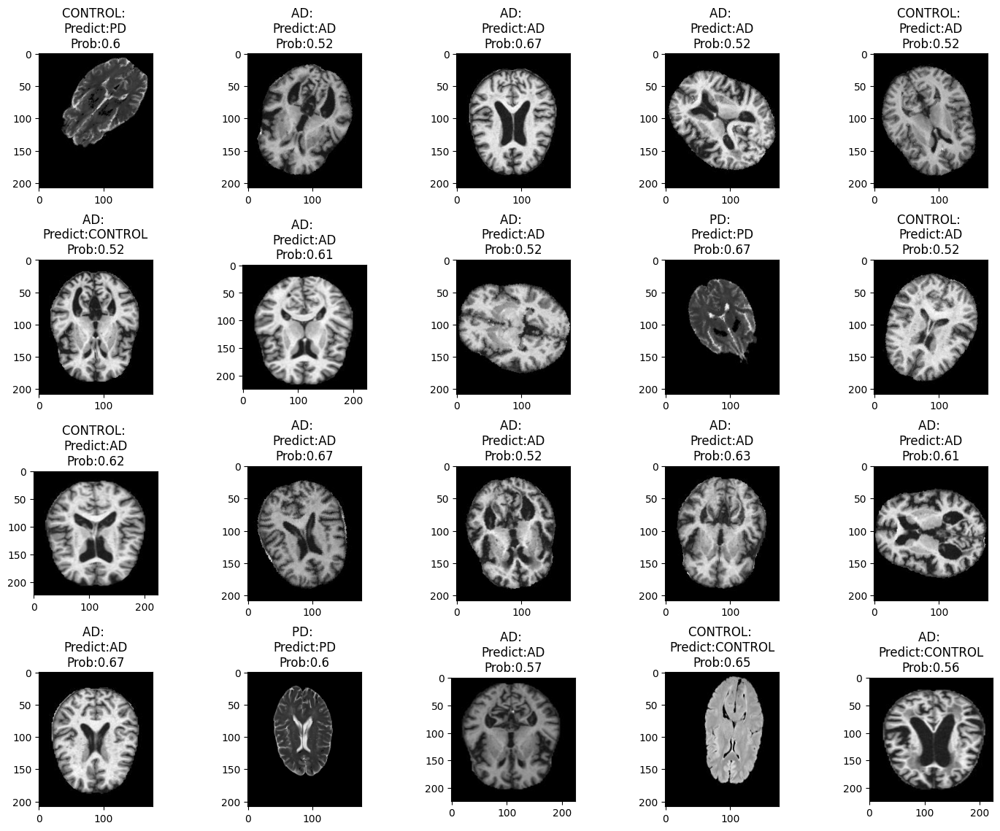

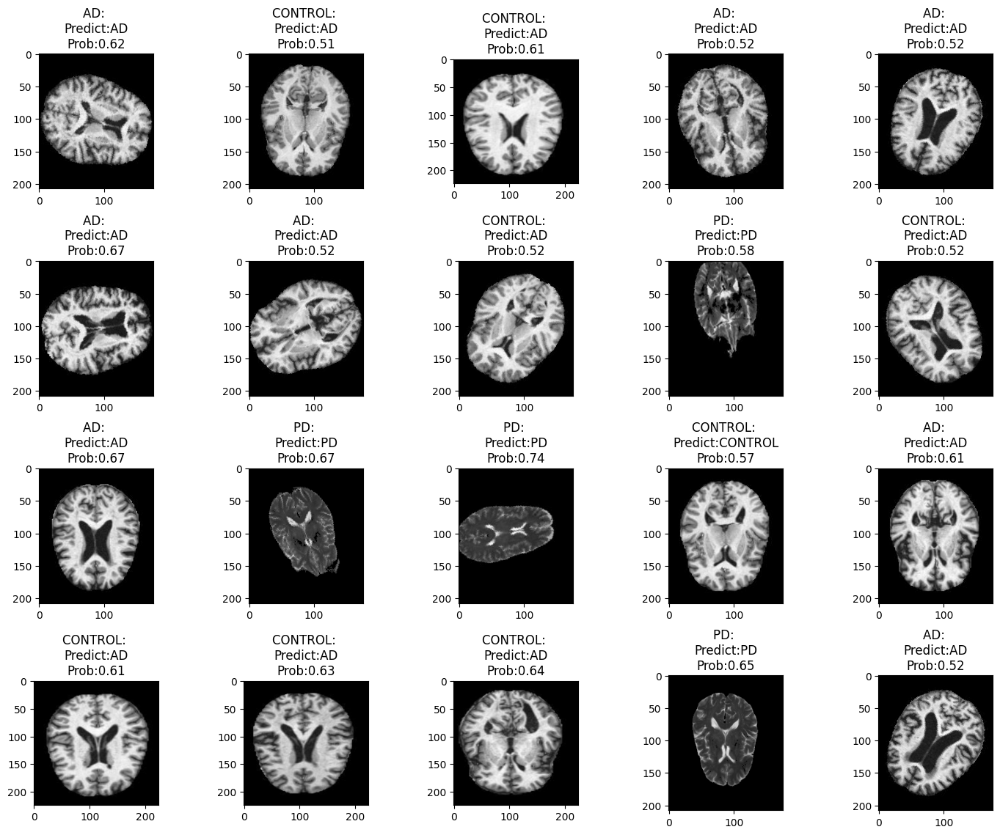

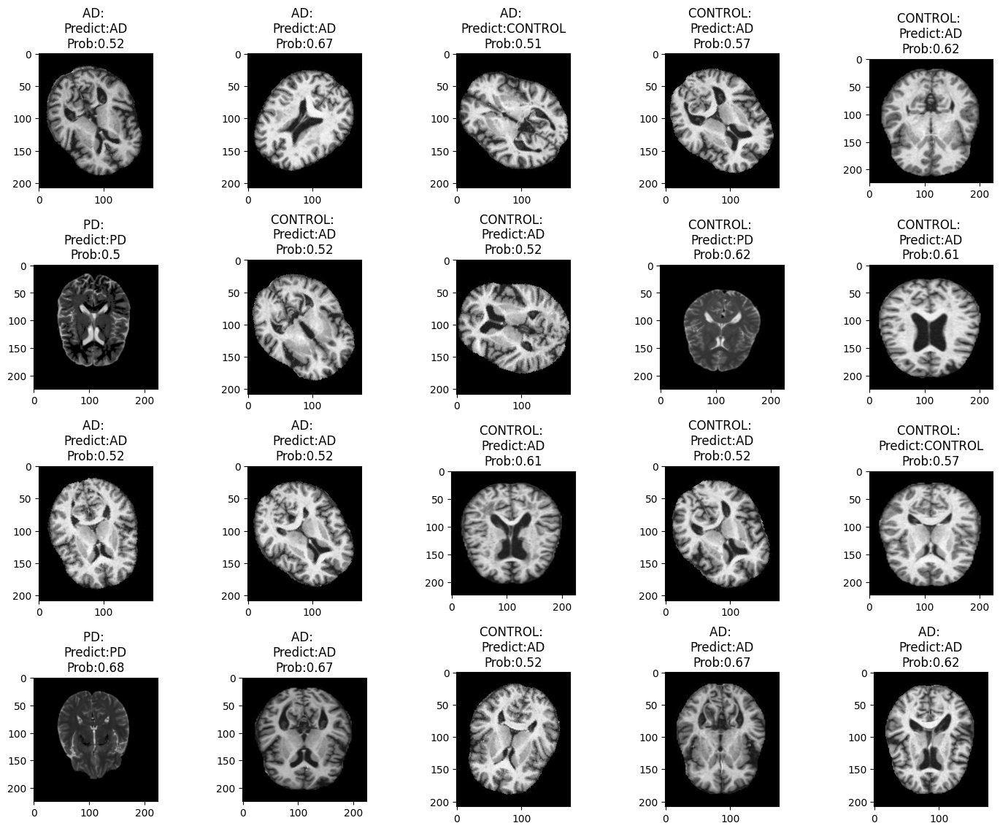

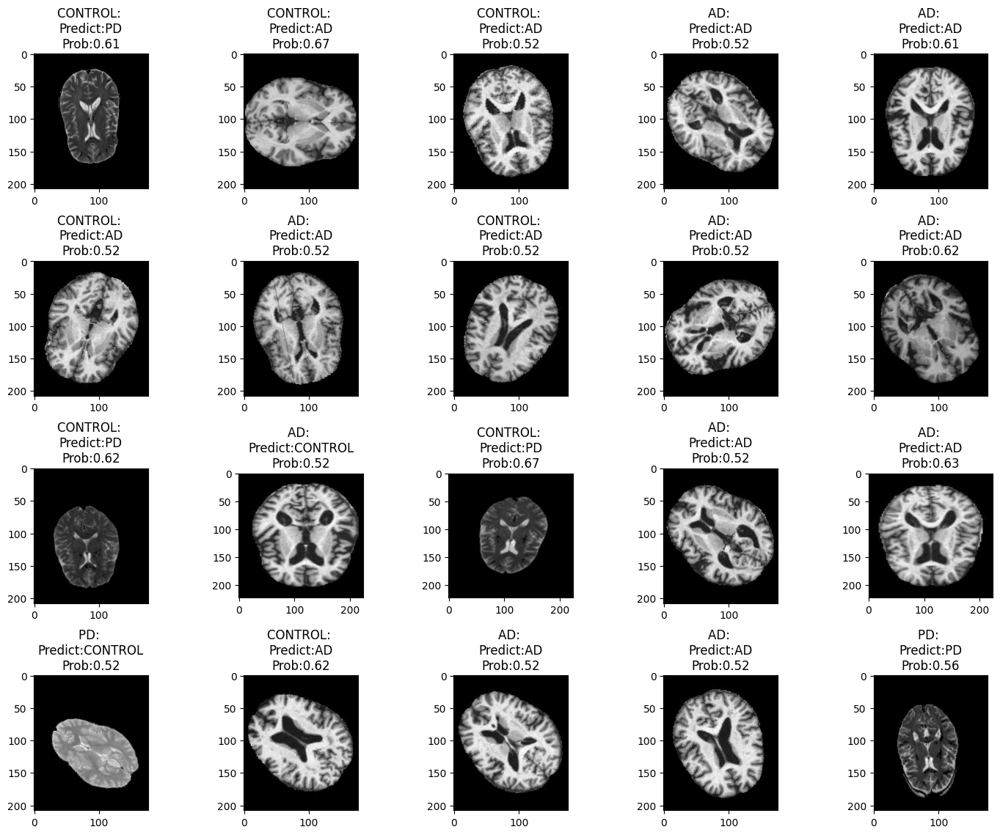

In [ ]:
sample_picture()
sample_picture()
sample_picture()
sample_picture()
sample_picture()

## Outsite data testing

In [ ]:
!wget https://universe.roboflow.com/ds/fx3tNSqjNJ?key=N4VBuJEAJf

In [ ]:
!unzip /content/fx3tNSqjNJ?key=N4VBuJEAJf